# Working Memory Architecture and Demand (WMAD) Model

The model is the result of work from the **Montbretia Cabinet** team during the Neuromatch Academy [Impact Scholars Program](https://impact-scholars.neuromatch.io/) from October 2024 to April 2025.

The Working Memory Architecture and Demand (WMAD) model is a parallel GNN-LSTM structure that feeds a Multilayer Perceptron. It was created during the Impact Scholars Program.

The WMAD model's overall structure, as seen in the image below, is constructed of a GAT, a parallel LSTM, and an MLP that uses the GAT and LSTM outputs passed through a fusion layer. This model predicts involvement of working memory in tasks in a parcel-based manner. It recieves parcel-based BOLD time series data and generates a probability value between 0 and 1 that corresponds to the likelihood of an exposure being a high-demand task. Therefore, a probability score of 1 would correspond to a high-demand task that, in the HCP data that we are using, would be the same as a 2-back working memory task.

## Setup and dependencies

In [1]:
!pip install nipype --quiet
!pip install nilearn --quiet
!pip install nibabel --quiet
!pip install brainspace --quiet

import os
import sys
import time
import random
import tarfile
import requests
import warnings

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader, ConcatDataset

from torch_geometric.nn import GATConv

import nilearn
import nibabel as nib
import seaborn as sns
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

from nilearn import plotting
from nilearn import datasets

from tqdm.notebook import tqdm
from IPython.display import clear_output

import brainspace.plotting as bsp
from brainspace.datasets import load_parcellation

from sklearn.metrics import accuracy_score, f1_score, recall_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.modules.rnn")

## Parameters and Data Download
The data used for the model was shared by Neuromatch in the [Project Booklets](https://compneuro.neuromatch.io/projects/fMRI/README.html#:~:text=5%2D23%2C%202021-,HCP%20task%20datasets,-%23) and most of our data preparation is similar to what they have shared in the `load_hcp_task_with_behaviour.ipynb` in the [HCP 2021 + behavior](https://compneuro.neuromatch.io/projects/fMRI/README.html#:~:text=View-,HCP%202021%20%2B%20behavior,-HCP%202021) section.

Our target experiments (`TargetExperiments` variable below) are Working Memory, Emotion, and Language tasks.

In [2]:
N_SUBJECTS = 100
N_PARCELS  = 360 # Data aggregated into ROIs from Glasser parcellation

TR = 0.72  # Time resolution, in seconds

HEMIS  = ["Right", "Left"]
RUNS   = ["LR","RL"]
N_RUNS = 2

EXPERIMENTS = {
    "MOTOR"      : {"cond" : ["lf", "rf" ,"lh", "rh", "t", "cue"]},
    "WM"         : {"cond" : ["0bk_body", "0bk_faces", "0bk_places", "0bk_tools",
                              "2bk_body", "2bk_faces", "2bk_places", "2bk_tools"]},
    "SOCIAL"     : {"cond" : ["ment", "rnd"]},
    "GAMBLING"   : {"cond" : ["loss", "win"]},
    "EMOTION"    : {"cond" : ["fear", "neut"]},
    "LANGUAGE"   : {"cond" : ["math", "story"]},
    "RELATIONAL" : {"cond" : ["match", "relation"]}
}

TargetExperiments = ["WM", "EMOTION", "LANGUAGE"]

TargetConditions  = ["0bk_body", "0bk_faces", "0bk_places", "0bk_tools",
                     "2bk_body", "2bk_faces", "2bk_places", "2bk_tools",
                     "fear"    , "neut"     , "math"      , "story"    ]

In [3]:
fname = "hcp_task.tgz"
url   = "https://osf.io/2y3fw/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("Download FAILED: Connection Error!")
  else:
    if r.status_code != requests.codes.ok:
      print("Download FAILED!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)


HCP_DIR = "./hcp_task"

with tarfile.open(fname) as tfile:
  tfile.extractall(".")

In [4]:
SubjectIDs = np.loadtxt(os.path.join(HCP_DIR, "subjects_list.txt"), dtype = "str")
SubjectIDs = list(SubjectIDs)

In [5]:
# Load region information for Glasser parcellation
regions = np.load(f"{HCP_DIR}/regions.npy").T

region_info = dict(
    name=regions[0].tolist(),
    network=regions[1],
    hemi=["Right"]*int(N_PARCELS/2) + ["Left"]*int(N_PARCELS/2),
)

In [6]:
ventral_attention_parcels    = [121, 134]

orbital_affective_parcels    = [111, 165, 289, 291, 345]

dorsal_attention_parcels     = [26, 139, 140, 206, 207, 320]

limbic_parcels               = [109, 111, 165, 289, 291, 345]

auditory_parcels             = [23, 102, 103, 123, 172, 173,
                                174, 282, 286, 287, 288, 303, 352, 353, 354]

default_mode_parcels         = [11, 24, 25, 27,
                                73, 74, 78, 80, 122, 124, 127, 128, 138, 171,
                                191, 205, 254, 258, 302, 304, 308, 318, 351]

language_parcels             = [10, 45, 49, 94,
                                95, 115, 126, 135, 136, 142, 145, 225, 229,
                                274, 275, 295, 296, 306, 315, 316, 322, 325]

frontoparietal_parcels       = [13, 14,
                                28, 62, 72, 76, 79, 81, 82, 84, 96, 97, 110,
                                132, 143, 144, 148, 169, 170, 208, 242, 252,
                                256, 259, 260, 262, 264, 276, 277, 290, 298]

somatomotor_parcels          = [7, 8, 35, 38, 39, 40, 41, 46,
                                50, 51, 52, 53, 54, 55, 99, 100, 101, 167,
                                187, 188, 215, 218, 219, 220, 221, 226, 230,
                                231, 232, 233, 234, 235, 279, 280, 281, 347]

cingulo_opercular_parcels    = [9, 36, 37, 42, 43, 44, 56, 57, 58, 59, 98,
                                104, 105, 107, 112, 113, 114, 116, 178, 179,
                                189, 190, 204, 216, 217, 222, 223, 224, 236,
                                237, 238, 239, 257, 261, 263, 265, 275, 277,
                                285, 292, 293, 346, 348, 357, 358, 359]

visual_parcels               = [0, 1, 2, 3, 4, 5, 6,
                                12, 15, 16, 17, 18, 19, 20, 21, 22, 47, 48,
                                137, 141, 151, 152, 153, 155, 156, 157, 158,
                                159, 162, 186, 192, 195, 196, 197, 198, 199,
                                200, 201, 202, 227, 228, 317, 321, 331, 332,
                                333, 335, 336, 337, 338, 339, 342]

posterior_multimodal_parcels = [29, 30, 31, 32, 33, 34, 60, 61, 63, 64, 65,
                                66, 67, 68, 69, 70, 71, 75, 86, 87, 88, 89,
                                117, 118, 119, 130, 131, 133, 154, 160, 161,
                                163, 164, 175, 176, 177, 180, 181, 182, 183,
                                184, 185, 192, 193, 194, 195, 196, 197, 198,
                                199, 200, 201, 202, 214, 215, 216, 217, 218,
                                219, 220, 221, 230, 231, 232, 233, 234, 235,
                                246, 247, 248, 249, 250, 251, 252, 253, 255,
                                266, 267, 269, 270, 271, 272, 273, 276, 277,
                                278, 279, 280, 281, 283, 284, 297, 299, 300,
                                301, 305, 307, 309, 310, 311, 312, 313, 314,
                                319, 323, 324, 326, 327, 328, 329, 330, 341,
                                344, 349, 350]

# Dictionary of subnetworks with no. of parcels and the list of corresponding parcels.
subnetworks = {
    f"visual_nw_{len(visual_parcels)}"                             : visual_parcels             ,
    f"limbic_nw_{len(limbic_parcels)}"                             : limbic_parcels             ,
    f"auditory_nw_{len(auditory_parcels)}"                         : auditory_parcels           ,
    f"language_nw_{len(language_parcels)}"                         : language_parcels           ,
    f"somatomotor_nw_{len(somatomotor_parcels)}"                   : somatomotor_parcels        ,
    f"default_mode_nw_{len(default_mode_parcels)}"                 : default_mode_parcels       ,
    f"frontoparietal_nw_{len(frontoparietal_parcels)}"             : frontoparietal_parcels     ,
    f"dorsal_attention_nw_{len(dorsal_attention_parcels)}"         : dorsal_attention_parcels   ,
    f"cingulo_opercular_nw_{len(cingulo_opercular_parcels)}"       : cingulo_opercular_parcels  ,
    f"orbital_affective_nw_{len(orbital_affective_parcels)}"       : orbital_affective_parcels  ,
    f"ventral_attention_nw_{len(ventral_attention_parcels)}"       : ventral_attention_parcels  ,
    f"posterior_multimodal_nw_{len(posterior_multimodal_parcels)}" : posterior_multimodal_parcels
}

In [7]:
Glasser_parcels_labels = ({
      0: "V1_L"    ,   1: "V1_R"    ,   2: "V2_L"    ,   3: "V2_R"    ,   4: "V3_L"    ,   5: "V3_R"    ,
      6: "V4_L"    ,   7: "V4_R"    ,   8: "V3A_L"   ,   9: "V3A_R"   ,  10: "V3B_L"   ,  11: "V3B_R"   ,
     12: "V6_L"    ,  13: "V6_R"    ,  14: "V6A_L"   ,  15: "V6A_R"   ,  16: "V7_L"    ,  17: "V7_R"    ,
     18: "V8_L"    ,  19: "V8_R"    ,  20: "IPS1_L"  ,  21: "IPS1_R"  ,  22: "MST_L"   ,  23: "MST_R"   ,
     24: "LO1_L"   ,  25: "LO1_R"   ,  26: "LO2_L"   ,  27: "LO2_R"   ,  28: "MT_L"    ,  29: "MT_R"    ,
     30: "V3CD_L"  ,  31: "V3CD_R"  ,  32: "PHC1_L"  ,  33: "PHC1_R"  ,  34: "PHC2_L"  ,  35: "PHC2_R"  ,
     36: "FFC_L"   ,  37: "FFC_R"   ,  38: "PIT_L"   ,  39: "PIT_R"   ,  40: "VVC_L"   ,  41: "VVC_R"   ,
     42: "IT_L"    ,  43: "IT_R"    ,  44: "TPOJ1_L" ,  45: "TPOJ1_R" ,  46: "TPOJ2_L" ,  47: "TPOJ2_R" ,
     48: "TPOJ3_L" ,  49: "TPOJ3_R" ,  50: "STSdp_L" ,  51: "STSdp_R" ,  52: "STSvp_L" ,  53: "STSvp_R" ,
     54: "STSva_L" ,  55: "STSva_R" ,  56: "FEF_L"   ,  57: "FEF_R"   ,  58: "PEF_L"   ,  59: "PEF_R"   ,
     60: "AIP_L"   ,  61: "AIP_R"   ,  62: "VIP_L"   ,  63: "VIP_R"   ,  64: "LIPd_L"  ,  65: "LIPd_R"  ,
     66: "LIPv_L"  ,  67: "LIPv_R"  ,  68: "MIP_L"   ,  69: "MIP_R"   ,  70: "V6_L"    ,  71: "V6_R"    ,
     72: "V6A_L"   ,  73: "V6A_R"   ,  74: "V7_L"    ,  75: "V7_R"    ,  76: "V8_L"    ,  77: "V8_R"    ,
     78: "PHT_L"   ,  79: "PHT_R"   ,  80: "PIT_L"   ,  81: "PIT_R"   ,  82: "TPOJ1_L" ,  83: "TPOJ1_R" ,
     84: "TPOJ2_L" ,  85: "TPOJ2_R" ,  86: "TPOJ3_L" ,  87: "TPOJ3_R" ,  88: "STSdp_L" ,  89: "STSdp_R" ,
     90: "STSvp_L" ,  91: "STSvp_R" ,  92: "STSva_L" ,  93: "STSva_R" ,  94: "TE1p_L"  ,  95: "TE1p_R"  ,
     96: "TE1a_L"  ,  97: "TE1a_R"  ,  98: "TE2p_L"  ,  99: "TE2p_R"  , 100: "TE2a_L"  , 101: "TE2a_R"  ,
    102: "TGd_L"   , 103: "TGd_R"   , 104: "Tg1_L"   , 105: "Tg1_R"   , 106: "Tg2_L"   , 107: "Tg2_R"   ,
    108: "FST_L"   , 109: "FST_R"   , 110: "MTGd_L"  , 111: "MTGd_R"  , 112: "MTGv_L"  , 113: "MTGv_R"  ,
    114: "PHT_L"   , 115: "PHT_R"   , 116: "PIT_L"   , 117: "PIT_R"   , 118: "TF_L"    , 119: "TF_R"    ,
    120: "MST_L"   , 121: "MST_R"   , 122: "STV_L"   , 123: "STV_R"   , 124: "VVC_L"   , 125: "VVC_R"   ,
    126: "PHC1_L"  , 127: "PHC1_R"  , 128: "PHC2_L"  , 129: "PHC2_R"  , 130: "RSC_L"   , 131: "RSC_R"   ,
    132: "POS1_L"  , 133: "POS1_R"  , 134: "POS2_L"  , 135: "POS2_R"  , 136: "POS3_L"  , 137: "POS3_R"  ,
    138: "DVT_L"   , 139: "DVT_R"   , 140: "VCC_L"   , 141: "VCC_R"   , 142: "PCC_L"   , 143: "PCC_R"   ,
    144: "MCC_L"   , 145: "MCC_R"   , 146: "SCC_L"   , 147: "SCC_R"   , 148: "ACC_L"   , 149: "ACC_R"   ,
    150: "OFC_L"   , 151: "OFC_R"   , 152: "p32_L"   , 153: "p32_R"   , 154: "a32pr_L" , 155: "a32pr_R" ,
    156: "a32_L"   , 157: "a32_R"   , 158: "p24pr_L" , 159: "p24pr_R" , 160: "p24_L"   , 161: "p24_R"   ,
    162: "a24pr_L" , 163: "a24pr_R" , 164: "a24_L"   , 165: "a24_R"   , 166: "s32_L"   , 167: "s32_R"   ,
    168: "d32_L"   , 169: "d32_R"   , 170: "p10p_L"  , 171: "p10p_R"  , 172: "10v_L"   , 173: "10v_R"   ,
    174: "10d_L"   , 175: "10d_R"   , 176: "9m_L"    , 177: "9m_R"    , 178: "9p_L"    , 179: "9p_R"    ,
    180: "8m_L"    , 181: "8m_R"    , 182: "8d_L"    , 183: "8d_R"    , 184: "8v_L"    , 185: "8v_R"    ,
    186: "p10r_L"  , 187: "p10r_R"  , 188: "a10p_L"  , 189: "a10p_R"  , 190: "a10r_L"  , 191: "a10r_R"  ,
    192: "47m_L"   , 193: "47m_R"   , 194: "47s_L"   , 195: "47s_R"   , 196: "45_L"    , 197: "45_R"    ,
    198: "44_L"    , 199: "44_R"    , 200: "p9-46v_L", 201: "p9-46v_R", 202: "a9-46v_L", 203: "a9-46v_R",
    204: "p9-46d_L", 205: "p9-46d_R", 206: "a9-46d_L", 207: "a9-46d_R", 208: "p8-46v_L", 209: "p8-46v_R",
    210: "a8-46v_L", 211: "a8-46v_R", 212: "8B_L"    , 213: "8B_R"    , 214: "s6-8_L"  , 215: "s6-8_R"  ,
    216: "6v_L"    , 217: "6v_R"    , 218: "6d_L"    , 219: "6d_R"    , 220: "6a_L"    , 221: "6a_R"    ,
    222: "6mp_L"   , 223: "6mp_R"   , 224: "6ma_L"   , 225: "6ma_R"   , 226: "SPL1_L"  , 227: "SPL1_R"  , 
    228: "7Pm_L"   , 229: "7Pm_R"   , 230: "7Am_L"   , 231: "7Am_R"   , 232: "7PL_L"   , 233: "7PL_R"   ,
    234: "7AL_L"   , 235: "7AL_R"   , 236: "LIPv_L"  , 237: "LIPv_R"  , 238: "VIP_L"   , 239: "VIP_R"   ,
    240: "AIP_L"   , 241: "AIP_R"   , 242: "MIP_L"   , 243: "MIP_R"   , 244: "PEF_L"   , 245: "PEF_R"   ,
    246: "FEF_L"   , 247: "FEF_R"   , 248: "IFJ_L"   , 249: "IFJ_R"   , 250: "A4_L"    , 251: "A4_R"    ,
    252: "OP4_L"   , 253: "OP4_R"   , 254: "OP1_L"   , 255: "OP1_R"   , 256: "OP2-3_L" , 257: "OP2-3_R" ,
    258: "RI_L"    , 259: "RI_R"    , 260: "POS1_L"  , 261: "POS1_R"  , 262: "DVT_L"   , 263: "DVT_R"   ,
    264: "PGp_L"   , 265: "PGp_R"   , 266: "V3CD_L"  , 267: "V3CD_R"  , 268: "31pd_L"  , 269: "31pd_R"  ,
    270: "31pv_L"  , 271: "31pv_R"  , 272: "31a_L"   , 273: "31a_R"   , 274: "23d_L"   , 275: "23d_R"   ,
    276: "v23ab_L" , 277: "v23ab_R" , 278: "d23ab_L" , 279: "d23ab_R" , 280: "8C_L"    , 281: "8C_R"    ,
    282: "p32pr_L" , 283: "p32pr_R" , 284: "a32pr_L" , 285: "a32pr_R" , 286: "p32_L"   , 287: "p32_R"   ,
    288: "s32_L"   , 289: "s32_R"   , 290: "8BM_L"   , 291: "8BM_R"   , 292: "10d_L"   , 293: "10d_R"   , 
    294: "10v_L"   , 295: "10v_R"   , 296: "47m_L"   , 297: "47m_R"   , 298: "a47r_L"  , 299: "a47r_R"  ,
    300: "11l_L"   , 301: "11l_R"   , 302: "13l_L"   , 303: "13l_R"   , 304: "a24_L"   , 305: "a24_R"   ,
    306: "p24_L"   , 307: "p24_R"   , 308: "33pr_L"  , 309: "33pr_R"  , 310: "a24pr_L" , 311: "a24pr_R" ,
    312: "p24pr_L" , 313: "p24pr_R" , 314: "8Av_L"   , 315: "8Av_R"   , 316: "9m_L"    , 317: "9m_R"    ,
    318: "9p_L"    , 319: "9p_R"    , 320: "10pp_L"  , 321: "10pp_R"  , 322: "a9-46v_L", 323: "a9-46v_R",
    324: "46_L"    , 325: "46_R"    , 326: "i6-8_L"  , 327: "i6-8_R"  , 328: "s6-8_L"  , 329: "s6-8_R"  ,
    330: "a9-46d_L", 331: "a9-46d_R", 332: "p9-46v_L", 333: "p9-46v_R", 334: "p9-46d_L", 335: "p9-46d_R",
    336: "8Ad_L"   , 337: "8Ad_R"   , 338: "8B_L"    , 339: "8B_R"    , 340: "p10p_L"  , 341: "p10p_R"  ,
    342: "10r_L"   , 343: "10r_R"   , 344: "47s_L"   , 345: "47s_R"   , 346: "a47_L"   , 347: "a47_R"   ,
    348: "11m_L"   , 349: "11m_R"   , 350: "13m_L"   , 351: "13m_R"   , 352: "OFC_L"   , 353: "OFC_R"   ,
    354: "47l_L"   , 355: "47l_R"   , 356: "LIM_L"   , 357: "LIM_R"   , 358: "13b_L"   , 359: "13b_R"
})

## Preprocessing

### Preprocessing helper functions

#### Functions for extracting the data

In [8]:
def load_single_timeseries(subject, experiment, run, remove_mean = True):
    """Loads timeseries data for a single subject and single run.

    Arguments:
        subject      (str): Subject ID to load
        experiment   (str): Name of experiment ("WM", "EMOTION", "LANGUAGE", etc.)
        run          (int): Run index (0 or 1)
        remove_mean (bool): If True, the parcel-wise mean will be subtracted

    Returns:
        np.ndarray: Array of BOLD data values with shape (n_parcels x n_timepoints)
    """
    bold_run  = RUNS[run]
    bold_path = f"{HCP_DIR}/subjects/{subject}/{experiment}/tfMRI_{experiment}_{bold_run}"
    ts_path   = f"{bold_path}/data.npy"
    
    if not os.path.exists(ts_path):
        raise FileNotFoundError(f"Timeseries file not found: {ts_path}")
    ts = np.load(ts_path)
    
    if remove_mean:
        ts = ts - ts.mean(axis = 1, keepdims = True)  # Normalize by removing mean signal
    return ts

In [9]:
def load_evs_as_dict(subject, experiment, run):
    """Loads Explanatory Variables (EVs) data for one task experiment.

    Arguments:
        subject    (str): Subject ID
        experiment (str): Experiment name
        run        (int): Run index (0 or 1)
    
    Returns:
        dict: Dictionary containing EV data for each task condition
    """
    
    # Ensure "run" is an index, not a string like "LR"
    if isinstance(run, str):
        if run in RUNS:
            run = RUNS.index(run)  # Convert 'LR' or 'RL' to 0 or 1
            print(f"✅ Converted: RUNS[{run}] = {RUNS[run]} for experiment {experiment}")
        else:
            raise ValueError(f"❌ Invalid run string: {run}. Expected 'LR' or 'RL'.")
    
    print(f"🔍 Checking: RUNS[{run}] = {RUNS[run]} for experiment {experiment}")

    task_key = f"tfMRI_{experiment}_{RUNS[run]}"

    # Ensure experiment exists
    if experiment not in EXPERIMENTS:
        raise ValueError(f"❌ Experiment {experiment} not found in EXPERIMENTS.")

    evs = {}
    for cond in EXPERIMENTS[experiment]["cond"]:
        ev_file = f"{HCP_DIR}/subjects/{subject}/{experiment}/{task_key}/EVs/{cond}.txt"
        
        if not os.path.exists(ev_file):
            raise FileNotFoundError(f"❌ EV file not found: {ev_file}")
        
        ev_array  = np.loadtxt(ev_file, ndmin = 2, unpack = True)
        evs[cond] = dict(zip(["onset", "duration", "amplitude"], ev_array))

    return evs

In [10]:
def create_dataframe(subject, experiment):
    """Creates a dataframe containing parcel-based BOLD signals with a MultiIndex.

    Arguments:
        subject    (str): Subject ID
        experiment (str): Experiment name

    Returns:
        pd.DataFrame: Dataframe with MultiIndex ('subject', 'experiment', 'run', 'condition', 'timepoint')
                      and columns for parcel BOLD signals and event information.
    """
    all_data = []

    for run_index in range(2):  # Iterate over LR and RL runs
        run_label = RUNS[run_index]
        try:
            ts  = load_single_timeseries(subject, experiment, run_index)
            evs = load_evs_as_dict(subject, experiment, run_index)
        except FileNotFoundError as e:
            print(e)
            continue

        n_parcels, n_timepoints = ts.shape

        for condition, ev_data in evs.items():
            onset_times = ev_data["onset"]
            durations   = ev_data["duration"]
            amplitudes  = ev_data["amplitude"]

            for onset, duration, amplitude in zip(onset_times, durations, amplitudes):
                start_frame = int(onset / TR)
                end_frame   = start_frame + int(duration / TR)

                for time_point in range(start_frame, end_frame):
                    if time_point < n_timepoints:  # Ensure time point is within bounds
                        row = {
                            "subject"      : subject    ,
                            "experiment"   : experiment ,
                            "run"          : run_label  ,
                            "condition"    : condition  ,
                            "timepoint"    : time_point ,
                            "EV_onset"     : onset      ,
                            "EV_duration"  : duration   ,
                            "EV_amplitude" : amplitude
                        }
                        # Add BOLD signal data for all parcels
                        row.update({f"parcel_{i + 1}": ts[i, time_point] for i in range(n_parcels)})
                        all_data.append(row)

    df = pd.DataFrame(all_data)
    if not df.empty:
        df = df.set_index(["subject", "experiment", "run", "condition", "timepoint"])

    return df

In [11]:
def save_to_csv(df, output_folder, filename):
    """Saves a dataframe as a CSV file in the specified directory.
    
    Arguments:
        df   (pd.DataFrame): Dataframe to save
        output_folder (str): Directory where file should be saved
        filename      (str): Name of the output CSV file

    Saves the .csv file into specified output directory.
    """
    os.makedirs(output_folder, exist_ok = True)
    file_path = os.path.join(output_folder, filename)
    df.to_csv(file_path, index = False)

In [12]:
def process_subject(subject, experiments, output_folder):
    """Processes fMRI data for a subject, creates a "raw" dataframe, and saves it as a CSV.

    Arguments:
        subject       (str): Subject ID
        experiments  (list): List of experiments to process
        output_folder (str): Directory where the output CSV should be saved

    Saves the processed "raw" dataframe as a .csv file in the specified output directory.
    """
    all_dfs = []

    for experiment in experiments:
        df = create_dataframe(subject, experiment)
        if not df.empty:
            all_dfs.append(df)
        else:
            print(f"No data to save for subject {subject}, experiment {experiment}.")

    if all_dfs:
        raw_df = pd.concat(all_dfs, axis=0)
        save_to_csv(raw_df.reset_index(), output_folder, f"{subject}_raw_data.csv")
        print(f"Successfully created and saved raw dataframe for subject {subject}.")
        return raw_df
    else:
        print(f"No data to save for subject {subject}.")
        return None

In [13]:
def create_and_save_metadata_labels(raw_df, output_folder, subject_id, label_map):
    """Creates and saves the metadata dataframe and labels from the raw dataframe.

    Arguments:
        raw_df (pd.DataFrame): The "raw" dataframe with MultiIndex
                               ('subject', 'experiment', 'run', 'condition', 'timepoint').
        output_folder   (str): Directory where output files should be saved.
        subject_id      (str): Subject ID.
        label_map      (dict): Dictionary mapping condition strings to integer labels.
    """
    if raw_df is None or raw_df.empty:
        print(f"No raw data available for subject {subject_id} to create metadata and labels.")
        return

    # Create metadata dataframe
    metadata_df       = raw_df[["EV_onset", "EV_duration", "EV_amplitude"]]
    metadata_filename = f"{subject_id}_metadata.csv"
    
    save_to_csv(metadata_df.reset_index(), output_folder, metadata_filename)
    print(f"Successfully created and saved metadata for subject {subject_id}.")

    # Create integer labels
    string_labels   = raw_df.index.get_level_values("condition")
    integer_labels  = np.array([label_map.get(label, -1) for label in string_labels])
    labels_filename = f"{subject_id}_labels.npy"
    labels_path     = os.path.join(output_folder, labels_filename)
    
    np.save(labels_path, integer_labels)
    print(f"Successfully created and saved integer labels for subject {subject_id}.")

#### Functions for creating the matrices

In [14]:
def process_wm_data_for_subject(subject_id, data_dir = "./processed_data/", binary_label_map = None):
    """
    Processes the Working Memory (WM) task data for a single subject to create
    fMRI matrices, adjacency matrices (functional connectivity), and target labels
    for the LR and RL runs.

    Args:
        subject_id        (str): The ID of the subject.
        data_dir          (str): The directory where the processed data files are stored.
        binary_label_map (dict): A mapping from condition strings to binary labels (0 or 1).

    Returns:
        dict: A dictionary containing lists for 'fmri_matrices', 'adjacency_matrices',
              and 'target_labels', each with two elements (for LR and RL runs).
              Returns None if the raw data file is not found.
    """
    if binary_label_map is None:
        binary_label_map = {
            "0bk_body":  0, "0bk_faces":  0, "0bk_places":  0, "0bk_tools":  0,
            "2bk_body":  1, "2bk_faces":  1, "2bk_places":  1, "2bk_tools":  1,
            "fear"    : -1, "neut"     : -1, "story"     : -1, "math"     : -1
        }

    raw_data_path = f"{data_dir}/{subject_id}_raw_data.csv"
    try:
        raw_df = pd.read_csv(raw_data_path)
        wm_df = raw_df[raw_df["experiment"] == "WM"].sort_values(by=["run", "timepoint"])

        fmri_matrices      = []
        adjacency_matrices = []
        target_labels      = []

        for run in ["LR", "RL"]:
            run_df = wm_df[wm_df["run"] == run]
            if not run_df.empty:
                # Extract fMRI data (360 parcels x timepoints)
                fmri_data = run_df[[f"parcel_{i+1}" for i in range(360)]].values.T

                # Calculate functional connectivity (360 x 360)
                connectivity_matrix = np.corrcoef(fmri_data)

                # Extract and map target labels (timepoints x 1)
                conditions = run_df["condition"].values
                labels     = np.array([binary_label_map.get(cond, -1) for cond in conditions]).reshape(-1, 1)

                fmri_matrices.append(fmri_data)
                adjacency_matrices.append(connectivity_matrix)
                target_labels.append(labels)
            else:
                print(f"No WM data found for subject {subject_id}, run {run}.")
                return None

        return {
            "fmri_matrices"      : fmri_matrices,
            "adjacency_matrices" : adjacency_matrices,
            "target_labels"      : target_labels
        }

    except FileNotFoundError:
        print(f"Error: Raw data file not found for subject {subject_id} at {raw_data_path}")
        return None

In [15]:
def save_processed_wm_data(subject_id, processed_data, save_dir = "./processed_wm_data/"):
    """
    Saves the processed Working Memory (WM) data for a single subject to disk.

    Args:
        subject_id      (str): The ID of the subject.
        processed_data (dict): A dictionary containing 'fmri_matrices', 'adjacency_matrices',
                               'target_labels'.
        save_dir        (str): The directory where the processed data should be saved.
    """
    if processed_data is None:
        return

    os.makedirs(save_dir, exist_ok = True)
    subject_dir = os.path.join(save_dir, subject_id)
    os.makedirs(subject_dir, exist_ok = True)

    np.save(os.path.join(subject_dir, "fmri_lr.npy")  , processed_data["fmri_matrices"][0])
    np.save(os.path.join(subject_dir, "fmri_rl.npy")  , processed_data["fmri_matrices"][1])
    np.save(os.path.join(subject_dir, "adj_lr.npy")   , processed_data["adjacency_matrices"][0])
    np.save(os.path.join(subject_dir, "adj_rl.npy")   , processed_data["adjacency_matrices"][1])
    np.save(os.path.join(subject_dir, "labels_lr.npy"), processed_data["target_labels"][0])
    np.save(os.path.join(subject_dir, "labels_rl.npy"), processed_data["target_labels"][1])

    print(f"Saved processed WM data for subject {subject_id} to {subject_dir}/")

### Preparing data for matrix creation

In [16]:
label_map = {
    "0bk_body": 0, "0bk_faces": 1, "0bk_places":  2, "0bk_tools":  3,
    "2bk_body": 4, "2bk_faces": 5, "2bk_places":  6, "2bk_tools":  7,
    "fear"    : 8, "neut"     : 9, "story"     : 10, "math"     : 11
}

output_directory = "./processed_data"
os.makedirs(output_directory, exist_ok = True)

print("Processing all subjects (with integer labels):")

for subject_id in tqdm(SubjectIDs, desc = "Processing Subjects"):
    print(f"Processing subject: {subject_id}")
    
    raw_df = process_subject(subject_id, TargetExperiments, output_directory)
    
    if raw_df is not None:
        create_and_save_metadata_labels(raw_df, output_directory, subject_id, label_map)

print("\n✅ Processing of all subjects complete (with integer labels)!")

Processing all subjects (with integer labels):


Processing Subjects:   0%|          | 0/100 [00:00<?, ?it/s]

Processing subject: 100307
🔍 Checking: RUNS[0] = LR for experiment WM
🔍 Checking: RUNS[1] = RL for experiment WM
🔍 Checking: RUNS[0] = LR for experiment EMOTION
🔍 Checking: RUNS[1] = RL for experiment EMOTION
🔍 Checking: RUNS[0] = LR for experiment LANGUAGE
🔍 Checking: RUNS[1] = RL for experiment LANGUAGE
Successfully created and saved raw dataframe for subject 100307.
Successfully created and saved metadata for subject 100307.
Successfully created and saved integer labels for subject 100307.
Processing subject: 100408
🔍 Checking: RUNS[0] = LR for experiment WM
🔍 Checking: RUNS[1] = RL for experiment WM
🔍 Checking: RUNS[0] = LR for experiment EMOTION
🔍 Checking: RUNS[1] = RL for experiment EMOTION
🔍 Checking: RUNS[0] = LR for experiment LANGUAGE
🔍 Checking: RUNS[1] = RL for experiment LANGUAGE
Successfully created and saved raw dataframe for subject 100408.
Successfully created and saved metadata for subject 100408.
Successfully created and saved integer labels for subject 100408.
Proc

#### Inspect the data (3 random subjects)

In [17]:
num_subjects_to_inspect = 3

random_subjects   = random.sample(SubjectIDs, min(num_subjects_to_inspect, len(SubjectIDs)))
label_map_reverse = {v: k for k, v in label_map.items()}

for subject_id in random_subjects:
    labels_path   = f"./processed_data/{subject_id}_labels.npy"
    raw_data_path = f"./processed_data/{subject_id}_raw_data.csv"

    try:
        integer_labels = np.load(labels_path)
        raw_df = pd.read_csv(raw_data_path)

        print(f"\n--- Subject: {subject_id} ---")
        print(f"  Shape of integer labels array: {integer_labels.shape}")
        print(f"  Number of rows in raw dataframe: {len(raw_df)}")

        if len(integer_labels) > 0:
            unique_labels_int = np.unique(integer_labels)
            unique_labels_str = [label_map_reverse.get(label, "Unknown") for label in unique_labels_int]
            print(f"  Unique Integer Labels: {unique_labels_int}")
            print(f"  Unique String Labels: {unique_labels_str}")
        else:
            print("  No integer labels found.")

        print("\nFirst 10 integer labels:")
        print(integer_labels[:10])

        print("\nFirst 10 conditions from raw data:")
        print(raw_df['condition'][:10].values)

    except FileNotFoundError:
        print(f"Error: File not found for subject {subject_id}")
    except Exception as e:
        print(f"An error occurred for subject {subject_id}: {e}")


--- Subject: 114924 ---
  Shape of integer labels array: (1466,)
  Number of rows in raw dataframe: 1466
  Unique Integer Labels: [ 0  1  2  3  4  5  6  7  8  9 10 11]
  Unique String Labels: ['0bk_body', '0bk_faces', '0bk_places', '0bk_tools', '2bk_body', '2bk_faces', '2bk_places', '2bk_tools', 'fear', 'neut', 'story', 'math']

First 10 integer labels:
[0 0 0 0 0 0 0 0 0 0]

First 10 conditions from raw data:
['0bk_body' '0bk_body' '0bk_body' '0bk_body' '0bk_body' '0bk_body'
 '0bk_body' '0bk_body' '0bk_body' '0bk_body']

--- Subject: 106016 ---
  Shape of integer labels array: (1477,)
  Number of rows in raw dataframe: 1477
  Unique Integer Labels: [ 0  1  2  3  4  5  6  7  8  9 10 11]
  Unique String Labels: ['0bk_body', '0bk_faces', '0bk_places', '0bk_tools', '2bk_body', '2bk_faces', '2bk_places', '2bk_tools', 'fear', 'neut', 'story', 'math']

First 10 integer labels:
[0 0 0 0 0 0 0 0 0 0]

First 10 conditions from raw data:
['0bk_body' '0bk_body' '0bk_body' '0bk_body' '0bk_body' '

### Matrix and graph creation

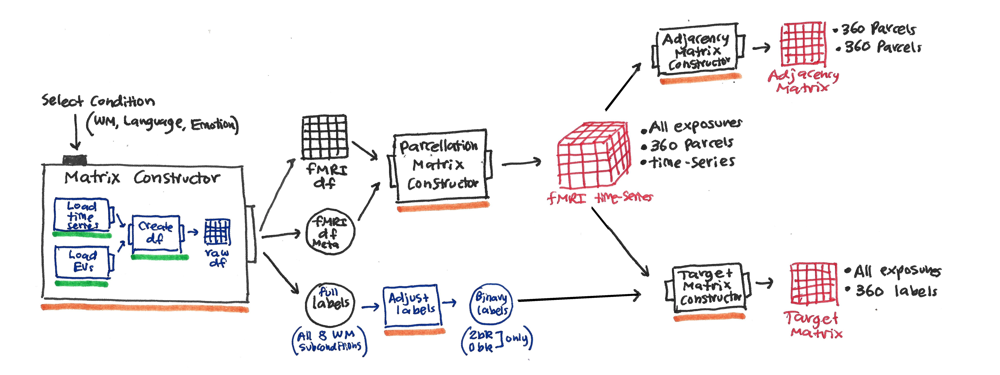

**Prepared Data Matrices for Working Memory (WM) Task**

For each subject and each run (LR and RL) of the Working Memory (WM) task, we have generated the following data structures:

1.  **fMRI Matrix:** This is a 2D NumPy array with dimensions (360 parcels x 608 timepoints). It contains the BOLD signal time series for each of the 360 brain parcels across the duration of the WM task run.

2.  **Adjacency Matrix (Functional Connectivity):** This is a 2D NumPy array with dimensions (360 parcels x 360 parcels). It represents the functional connectivity between all pairs of brain parcels during the WM task run. The values in this matrix are Pearson correlation coefficients calculated between the time series of each pair of parcels. This matrix will serve as the graph structure input for the GAT/GNN component of the model.

3.  **Target Label Vector:** This is a 2D NumPy array with dimensions (608 timepoints x 1). It contains the binary labels (0 or 1) corresponding to the cognitive state at each timepoint. The WM conditions (0bk_body, 0bk_faces, 0bk_places, 0bk_tools) are mapped to 0, and the 2bk conditions (2bk_body, 2bk_faces, 2bk_places, 2bk_tools) are mapped to 1. This vector will be used as the target for training the LSTM and the final MLP to predict the cognitive state (0bk or 2bk) based on the fMRI data.

#### Create the files for Working Memory

In [18]:
output_wm_data_dir = "./processed_wm_data/"
os.makedirs(output_wm_data_dir, exist_ok = True)

print("Processing and saving WM data for all subjects:")

for subject_id in tqdm(SubjectIDs, desc = "Processing Subjects"):
    processed_data = process_wm_data_for_subject(subject_id)
    
    if processed_data:
        save_processed_wm_data(subject_id, processed_data, save_dir = output_wm_data_dir)

print("\n✅ Processed and saved WM data for all subjects!")

Processing and saving WM data for all subjects:


Processing Subjects:   0%|          | 0/100 [00:00<?, ?it/s]

Saved processed WM data for subject 100307 to ./processed_wm_data/100307/
Saved processed WM data for subject 100408 to ./processed_wm_data/100408/
Saved processed WM data for subject 101915 to ./processed_wm_data/101915/
Saved processed WM data for subject 102816 to ./processed_wm_data/102816/
Saved processed WM data for subject 103414 to ./processed_wm_data/103414/
Saved processed WM data for subject 103515 to ./processed_wm_data/103515/
Saved processed WM data for subject 103818 to ./processed_wm_data/103818/
Saved processed WM data for subject 105115 to ./processed_wm_data/105115/
Saved processed WM data for subject 105216 to ./processed_wm_data/105216/
Saved processed WM data for subject 106016 to ./processed_wm_data/106016/
Saved processed WM data for subject 106319 to ./processed_wm_data/106319/
Saved processed WM data for subject 110411 to ./processed_wm_data/110411/
Saved processed WM data for subject 111009 to ./processed_wm_data/111009/
Saved processed WM data for subject 11

## Model Training

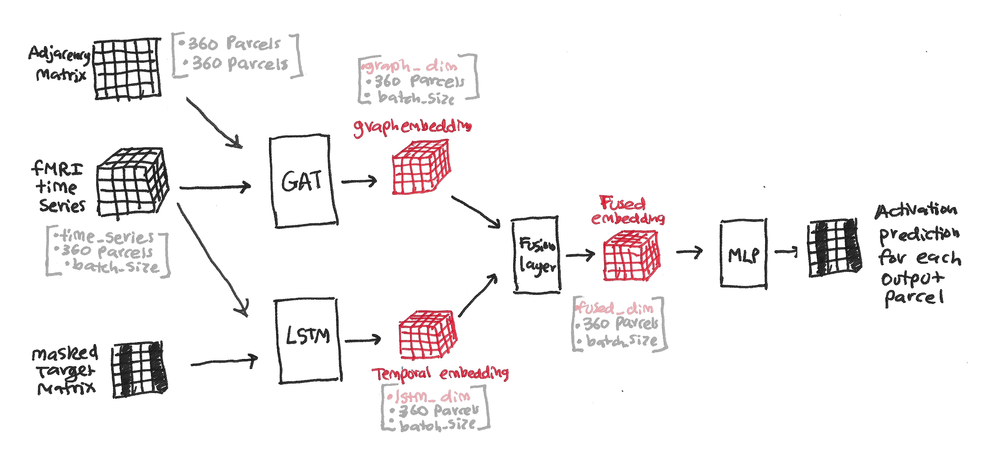

### Model preprocessing and visualization helper functions

In [19]:
def load_processed_wm_data(subject_id, data_dir = "./processed_wm_data/"):
    """
    Loads the processed Working Memory (WM) data for a single subject.

    Args:
        subject_id (str): The ID of the subject.
        data_dir   (str): The directory where the processed data files are stored.

    Returns:
        dict: A dictionary containing the loaded 'fmri_lr', 'fmri_rl', 'adj_lr', 'adj_rl',
              'labels_lr', and 'labels_rl' as NumPy arrays.
              Returns None if the subject's directory or files are not found.
    """
    subject_dir = os.path.join(data_dir, subject_id)
    
    if not os.path.isdir(subject_dir):
        print(f"Directory not found for subject {subject_id} at {subject_dir}")
        return None

    try:
        data = {
            "fmri_lr"   : np.load(os.path.join(subject_dir, "fmri_lr.npy")),
            "fmri_rl"   : np.load(os.path.join(subject_dir, "fmri_rl.npy")),
            "adj_lr"    : np.load(os.path.join(subject_dir, "adj_lr.npy")),
            "adj_rl"    : np.load(os.path.join(subject_dir, "adj_rl.npy")),
            "labels_lr" : np.load(os.path.join(subject_dir, "labels_lr.npy")),
            "labels_rl" : np.load(os.path.join(subject_dir, "labels_rl.npy"))
        }
        return data
    except FileNotFoundError as e:
        print(f"Error loading data for subject {subject_id}: {e}")
        return None

In [20]:
class WMParcelDataset(Dataset):
    """
    PyTorch Dataset for loading Working Memory (WM) task data and preparing
    fMRI, adjacency, and target matrices for a single subject and run.

    Args:
        subject_id                  (str): The ID of the subject.
        run                         (str): The run to load ('LR' or 'RL').
        data_dir          (str, optional): The directory where the processed WM data is stored.
                                           Defaults to "./processed_wm_data/".
        label_map        (dict, optional): A mapping from condition strings to integer labels (0-7 for WM).
                                           Defaults to the WM label map.
        binary_label_map (dict, optional): A mapping from WM condition strings to binary labels (0 or 1).
                                           Defaults to the binary WM label map.

    Returns:
        dict: A dictionary containing:
            - 'fmri': torch.Tensor of the fMRI data (n_parcels x n_timepoints).
            - 'adj': torch.Tensor of the adjacency matrix (n_parcels x n_parcels).
            - 'target': torch.Tensor of the target matrix (n_timepoints x n_parcels x 2).
            - 'metadata': torch.Tensor of the metadata (n_timepoints x metadata_features).
    """
    def __init__(self, subject_id, run, data_dir    = "./processed_wm_data/",
                 label_map = None, binary_label_map = None):
        self.subject_id = subject_id
        self.run        = run
        self.data_dir   = data_dir
        self.label_map  = label_map if label_map else {
            "0bk_body": 0, "0bk_faces": 1, "0bk_places": 2, "0bk_tools": 3,
            "2bk_body": 4, "2bk_faces": 5, "2bk_places": 6, "2bk_tools": 7
        }
        self.binary_label_map = binary_label_map if binary_label_map else {
            "0bk_body": 0, "0bk_faces": 0, "0bk_places": 0, "0bk_tools": 0,
            "2bk_body": 1, "2bk_faces": 1, "2bk_places": 1, "2bk_tools": 1
        }
        self.fmri_data = self._load_fmri()
        self.raw_df    = self._load_raw_dataframe()

    def _load_fmri(self):
        subject_dir = os.path.join(self.data_dir, self.subject_id)
        fmri_path   = os.path.join(subject_dir, f"fmri_{self.run.lower()}.npy")
        try:
            fmri = np.load(fmri_path)
            return torch.tensor(fmri, dtype=torch.float32) # (n_parcels x n_timepoints)
        except FileNotFoundError as e:
            print(f"Error loading fMRI data for subject {self.subject_id}, run {self.run}: {e}")
            return None

    def _load_raw_dataframe(self):
        raw_data_path = f"./processed_data/{self.subject_id}_raw_data.csv"
        try:
            raw_df = pd.read_csv(raw_data_path)
            wm_df  = raw_df[(raw_df["experiment"] == "WM") & (raw_df["run"] == self.run)]
            return wm_df.sort_values(by = ["timepoint"])
        except FileNotFoundError as e:
            print(f"Error loading raw dataframe for subject {self.subject_id}: {e}")
            return None

    def __len__(self):
        return 1 # Each instance of this dataset provides data for one subject and one run

    def __getitem__(self, idx):
        if self.fmri_data is None or self.raw_df is None:
            return None

        fmri = self.fmri_data # (n_parcels x n_timepoints)
        n_parcels, n_timepoints = fmri.shape

        # Create adjacency matrix (functional connectivity)
        adj = torch.tensor(np.corrcoef(fmri.numpy()), dtype = torch.float32) # (n_parcels x n_parcels)

        # Create target matrix (n_timepoints x n_parcels x 2)
        conditions = self.raw_df["condition"].values
        target     = torch.zeros((n_timepoints, n_parcels, 2), dtype = torch.float32)
        for t, cond in enumerate(conditions):
            binary_label = self.binary_label_map.get(cond)
            if binary_label is not None:
                target[t, :, binary_label] = 1.0 # One-hot encoding for 0bk or 2bk

        # Extract metadata (EV_onset, EV_duration, EV_amplitude)
        metadata = torch.tensor(self.raw_df[["EV_onset", "EV_duration", "EV_amplitude"]].values, dtype = torch.float32) # (n_timepoints x 3)

        return {
            "fmri"    : fmri.T, # (n_timepoints x n_parcels) - as input to LSTM
            "adj"     : adj,
            "target"  : target,
            "metadata": metadata
        }

In [21]:
def split_subjects(subject_ids, train_fraction = 0.8, random_state = 42):
    """
    Splits a list of subject IDs into training and testing sets.

    Args:
        subject_ids               (list): A list of subject IDs (strings).
        train_fraction (float, optional): The fraction of subjects to include in the training set.
                                          Defaults to 0.8.
        random_state     (int, optional): The random seed for shuffling to ensure reproducibility.
                                          Defaults to 42.

    Returns:
        tuple: A tuple containing two lists: (train_subjects, test_subjects).
    """
    n_subjects     = len(subject_ids)
    n_train        = int(train_fraction * n_subjects)
    
    rng            = np.random.RandomState(random_state)
    shuffled_ids   = rng.permutation(subject_ids)
    
    train_subjects = list(shuffled_ids[:n_train])
    test_subjects  = list(shuffled_ids[n_train:])
    
    return train_subjects, test_subjects

### Visualize WM data

#### Calculate the Average Adjacency Matrix

In [22]:
adjacency_matrices_lr = []
adjacency_matrices_rl = []
processed_wm_data_dir = "./processed_wm_data/"

print("Loading adjacency matrices...")
for subject_id in tqdm(SubjectIDs, desc = "Loading"):
    subject_dir = os.path.join(processed_wm_data_dir, subject_id)
    adj_lr_path = os.path.join(subject_dir, "adj_lr.npy")
    adj_rl_path = os.path.join(subject_dir, "adj_rl.npy")
    try:
        adj_lr = np.load(adj_lr_path)
        adj_rl = np.load(adj_rl_path)
        adjacency_matrices_lr.append(adj_lr)
        adjacency_matrices_rl.append(adj_rl)
    except FileNotFoundError:
        print(f"Adjacency matrix not found for subject {subject_id}")

if adjacency_matrices_lr and adjacency_matrices_rl:
    avg_adj_lr  = np.mean(np.stack(adjacency_matrices_lr), axis = 0)
    avg_adj_rl  = np.mean(np.stack(adjacency_matrices_rl), axis = 0)
    avg_adj_all = np.mean(np.stack([avg_adj_lr, avg_adj_rl]), axis = 0)
    print("\nAverage adjacency matrix calculated.")
else:
    avg_adj_all = None
    print("\nNo adjacency matrices found to average.")

Loading adjacency matrices...


Loading:   0%|          | 0/100 [00:00<?, ?it/s]


Average adjacency matrix calculated.


#### Calculate Average WM Activity

In [23]:
fmri_data_lr = []
fmri_data_rl = []

print("\nLoading fMRI data...")
for subject_id in tqdm(SubjectIDs, desc = "Loading"):
    subject_dir  = os.path.join(processed_wm_data_dir, subject_id)
    fmri_lr_path = os.path.join(subject_dir, "fmri_lr.npy")
    fmri_rl_path = os.path.join(subject_dir, "fmri_rl.npy")
    try:
        fmri_lr = np.load(fmri_lr_path)
        fmri_rl = np.load(fmri_rl_path)
        fmri_data_lr.append(fmri_lr)
        fmri_data_rl.append(fmri_rl)
    except FileNotFoundError:
        print(f"fMRI data not found for subject {subject_id}")

if fmri_data_lr and fmri_data_rl:
    all_fmri_data = np.concatenate(fmri_data_lr + fmri_data_rl, axis = 1) # Concatenate across time
    avg_activity  = np.mean(all_fmri_data, axis = 1) # Average across time and subjects
    print("\nAverage WM activity calculated (mean BOLD signal per parcel).")
else:
    avg_activity = None
    print("\nNo fMRI data found to calculate average activity.")


Loading fMRI data...


Loading:   0%|          | 0/100 [00:00<?, ?it/s]


Average WM activity calculated (mean BOLD signal per parcel).


#### Visualize average adjacency and WM activity

[get_dataset_dir] Dataset found in /home/saameh/nilearn_data/aal_SPM12

AAL Atlas keys: dict_keys(['description', 'maps', 'labels', 'indices'])


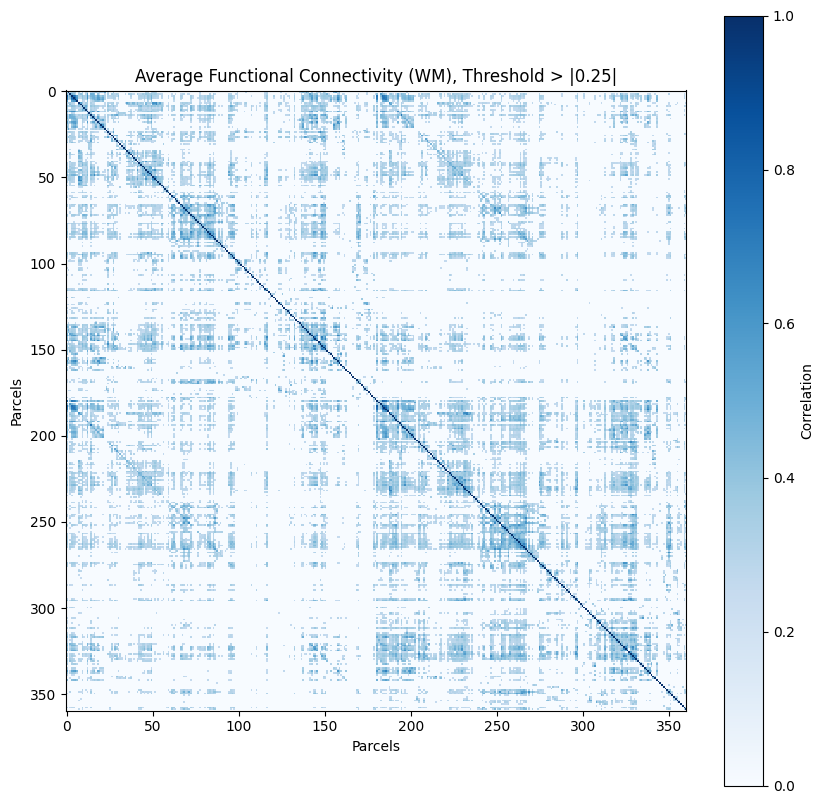

In [24]:
roits_aal = datasets.fetch_atlas_aal()
print(f"AAL Atlas keys: {roits_aal.keys()}")


if avg_adj_all is not None:
    threshold  = 0.25
    masked_adj = np.where(np.abs(avg_adj_all) > threshold, avg_adj_all, 0)

    plt.figure(figsize = (10, 10))
    plt.imshow(masked_adj, cmap = "Blues", interpolation = "nearest")
    plt.colorbar(label = "Correlation")
    plt.title(f"Average Functional Connectivity (WM), Threshold > |{threshold}|")
    plt.xlabel("Parcels")
    plt.ylabel("Parcels")
    plt.show()
else:
    print("Average adjacency matrix not available.")

In [25]:
# Placeholder for network visualization

In [26]:
# Placeholder for WM activity visualization

### Model setup helper functions

#### GAT layer

In [27]:
class GATLayer(nn.Module):
    def __init__(self, in_channels, out_channels, num_heads, dropout):
        super(GATLayer, self).__init__()
        self.conv    = GATConv(in_channels, out_channels, heads = num_heads, dropout = dropout)
        self.dropout = nn.Dropout(dropout)
        self.bn      = nn.BatchNorm1d(out_channels * num_heads) # Batch norm after attention

    def forward(self, x, adj):
        edge_index = adj.nonzero().t().contiguous().long()
        # Ensure x is 2D: (batch_size, n_parcels, in_channels) -> (n_parcels, in_channels)
        if x.ndim == 3:
            x = x.squeeze(0)
        h = self.conv(x, edge_index)
        h = self.bn(h)
        h = F.relu(h)
        h = self.dropout(h)
        return h

In [28]:
class GAT(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, num_heads, num_layers, dropout):
        super(GAT, self).__init__()
        self.layers = nn.ModuleList()
        self.layers.append(GATLayer(in_channels, hidden_channels, num_heads, dropout))
        for _ in range(num_layers - 1):
            self.layers.append(GATLayer(hidden_channels * num_heads, hidden_channels, num_heads, dropout))
        self.fc = nn.Linear(hidden_channels * num_heads, out_channels)

    def forward(self, x, adj):
        for layer in self.layers:
            x = layer(x, adj)
        x = self.fc(x)
        return x

#### LSTM module

In [29]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, dropout):
        super(LSTMModel, self).__init__()
        self.lstm    = nn.LSTM(input_size, hidden_size, num_layers, batch_first = True, dropout = dropout)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        # Input x shape: (batch_size, seq_len, input_size)
        out, _ = self.lstm(x)
        out    = self.dropout(out)
        # Output shape: (batch_size, seq_len, hidden_size)
        return out

#### MLP module

In [30]:
class MLP(nn.Module):
    def __init__(self, in_features, hidden_features, out_features, dropout):
        super(MLP, self).__init__()
        self.fc1     = nn.Linear(in_features, hidden_features)
        self.dropout = nn.Dropout(dropout)
        self.fc2     = nn.Linear(hidden_features, out_features)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

#### Full model

In [31]:
class ParcelClassifier(nn.Module):
    def __init__(self, n_parcels   , gat_hidden_channels, gat_num_heads  , gat_num_layers,
                 gat_dropout       , lstm_hidden_size   , lstm_num_layers, lstm_dropout  ,
                 fusion_output_size, mlp_hidden_size    , mlp_dropout    ):
        super(ParcelClassifier, self).__init__()

        self.gat = GAT(in_channels     = 1,                       # Input to GAT is single feature per node (can be initial BOLD at t=0 or constant)
                       hidden_channels = gat_hidden_channels,
                       out_channels    = fusion_output_size // 2, # Split fusion size between GAT and LSTM
                       num_heads       = gat_num_heads,
                       num_layers      = gat_num_layers,
                       dropout         =gat_dropout)

        self.lstm = LSTMModel(input_size  = n_parcels,
                              hidden_size = fusion_output_size // 2,
                              num_layers  = lstm_num_layers,
                              dropout     = lstm_dropout)

        self.mlp = MLP(in_features     = fusion_output_size,
                       hidden_features = mlp_hidden_size,
                       out_features    = 2, # Probability for 0bk or 2bk
                       dropout         = mlp_dropout)

        self.n_parcels = n_parcels

    def forward(self, fmri, adj):
        # GAT input ...
        initial_bold = fmri[:, 0].unsqueeze(-1)
        gat_output   = self.gat(initial_bold, adj)

        # LSTM input ...
        lstm_input  = fmri
        lstm_output = self.lstm(lstm_input)
        lstm_last   = lstm_output[:, -1, :]

        # Fusion: Concatenate GAT output and the last LSTM output for each parcel
        # Repeat lstm_last along the parcel dimension to match gat_output
        lstm_repeated = lstm_last.unsqueeze(1).repeat(1, self.n_parcels, 1)           # Shape: (1, n_parcels, fusion_output_size // 2)
        fused_output  = torch.cat([gat_output.unsqueeze(0), lstm_repeated], dim = -1) # Shape: (1, n_parcels, fusion_output_size)

        # MLP for final classification per parcel
        parcel_predictions = self.mlp(fused_output) # (1, n_parcels, 2)
        return torch.sigmoid(parcel_predictions)

#### Training the model

In [32]:
def calculate_metrics(outputs, targets):
    """Calculates accuracy, F1 score, and recall."""
    
    predicted = (outputs > 0.5).int().cpu().numpy()
    targets   = targets.int().cpu().numpy()
    accuracy  = accuracy_score(targets.flatten(), predicted.flatten())
    f1        = f1_score(targets.flatten(), predicted.flatten(), average = "binary", zero_division = 0)
    recall    = recall_score(targets.flatten(), predicted.flatten(), average = "binary", zero_division = 0)
    
    return accuracy, f1, recall

In [33]:
def train_model(model, train_subjects, device, learning_rate, weight_decay, num_epochs = 10):
    """Trains the model on the given subjects."""
    model.train()
    optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay = weight_decay)
    criterion = nn.BCELoss()
    history   = {"loss": [], "accuracy": [], "f1": [], "recall": []}

    for subject_id in train_subjects:
        train_dataset_lr = WMParcelDataset(subject_id, run = "LR")
        train_dataset_rl = WMParcelDataset(subject_id, run = "RL")

        if train_dataset_lr and train_dataset_rl:
            train_loader = DataLoader([train_dataset_lr[0], train_dataset_rl[0]], batch_size=1)

            for epoch in range(num_epochs):
                epoch_losses     = []
                epoch_accuracies = []
                epoch_f1_scores  = []
                epoch_recalls    = []
                for batch in train_loader:
                    fmri        = batch["fmri"].to(device)
                    adj         = batch["adj"].to(device).squeeze(0)
                    target_full = batch["target"].to(device)
                    target      = target_full[:, -1, :, :].squeeze(1)

                    optimizer.zero_grad()
                    output = model(fmri, adj)
                    loss   = criterion(output, target)
                    loss.backward()
                    optimizer.step()
                    epoch_losses.append(loss.item())

                    accuracy, f1, recall = calculate_metrics(output, target)
                    epoch_accuracies.append(accuracy)
                    epoch_f1_scores.append(f1)
                    epoch_recalls.append(recall)

                history["loss"].append(np.mean(epoch_losses))
                history["accuracy"].append(np.mean(epoch_accuracies))
                history["f1"].append(np.mean(epoch_f1_scores))
                history["recall"].append(np.mean(epoch_recalls))

    return history

### Split WM data into train and test sets

#### Main split

In [34]:
# Main train/test split
train_subjects, test_subjects = split_subjects(SubjectIDs)

print(f"Number of training subjects (main split): {len(train_subjects)}")
print(f"Number of testing subjects (main split): {len(test_subjects)}")

Number of training subjects (main split): 80
Number of testing subjects (main split): 20


#### Split for the hyperparameter search

In [35]:
# Further split the training set into training and validation for hyperparameter search
train_val_subjects, val_subjects = split_subjects(train_subjects, train_fraction = 0.8, random_state = 123)

print(f"Number of training subjects (for hyperparameter search): {len(train_val_subjects)}")
print(f"Number of validation subjects (for hyperparameter search): {len(val_subjects)}")

Number of training subjects (for hyperparameter search): 64
Number of validation subjects (for hyperparameter search): 16


### Run data check

In [36]:
# Run data check on a few training subjects
n_subjects_to_check = min(3, len(train_subjects))
print(f"--- Data Check on {n_subjects_to_check} Training Subjects ---")

for i in range(n_subjects_to_check):
    subject_id = train_subjects[i]
    print(f"\n--- Subject: {subject_id} ---")
    for run in ["LR", "RL"]:
        wm_dataset = WMParcelDataset(subject_id, run=run)
        if wm_dataset:
            sample = wm_dataset[0]
            print(f"  --- Run: {run} ---")
            print(f"    fMRI shape: {sample['fmri'].shape}")
            print(f"    Adjacency shape: {sample['adj'].shape}")
            print(f"    Target shape: {sample['target'].shape}")
            print(f"    Metadata shape: {sample['metadata'].shape}")
        else:
            print(f"  --- Run: {run} ---")
            print(f"    Could not load data for this run.")

print("\n--- End of Data Check ---")

--- Data Check on 3 Training Subjects ---

--- Subject: 188347 ---
  --- Run: LR ---
    fMRI shape: torch.Size([304, 360])
    Adjacency shape: torch.Size([360, 360])
    Target shape: torch.Size([304, 360, 2])
    Metadata shape: torch.Size([304, 3])
  --- Run: RL ---
    fMRI shape: torch.Size([304, 360])
    Adjacency shape: torch.Size([360, 360])
    Target shape: torch.Size([304, 360, 2])
    Metadata shape: torch.Size([304, 3])

--- Subject: 148335 ---
  --- Run: LR ---
    fMRI shape: torch.Size([304, 360])
    Adjacency shape: torch.Size([360, 360])
    Target shape: torch.Size([304, 360, 2])
    Metadata shape: torch.Size([304, 3])
  --- Run: RL ---
    fMRI shape: torch.Size([304, 360])
    Adjacency shape: torch.Size([360, 360])
    Target shape: torch.Size([304, 360, 2])
    Metadata shape: torch.Size([304, 3])

--- Subject: 160123 ---
  --- Run: LR ---
    fMRI shape: torch.Size([304, 360])
    Adjacency shape: torch.Size([360, 360])
    Target shape: torch.Size([304, 360

### Hyperparameter search

#### Helper function for hyperparameter search

In [37]:
def evaluate_model(model, val_subjects, device):
    """Evaluates the model on the validation subjects and returns the average loss."""
    model.eval()
    criterion    = nn.BCELoss()
    eval_history = {"loss": [], "accuracy": [], "f1": [], "recall": []}

    with torch.no_grad():
        for subject_id in val_subjects:
            val_dataset_lr = WMParcelDataset(subject_id, run = "LR")
            val_dataset_rl = WMParcelDataset(subject_id, run = "RL")

            if val_dataset_lr and val_dataset_rl:
                val_loader = DataLoader([val_dataset_lr[0], val_dataset_rl[0]], batch_size=1)

                subject_losses     = []
                subject_accuracies = []
                subject_f1_scores  = []
                subject_recalls    = []

                for batch in val_loader:
                    fmri        = batch["fmri"].to(device)
                    adj         = batch["adj"].to(device).squeeze(0)
                    target_full = batch["target"].to(device)
                    target      = target_full[:, -1, :, :].squeeze(1)

                    output = model(fmri, adj)
                    loss   = criterion(output, target)
                    subject_losses.append(loss.item())

                    accuracy, f1, recall = calculate_metrics(output, target)
                    subject_accuracies.append(accuracy)
                    subject_f1_scores.append(f1)
                    subject_recalls.append(recall)

                eval_history["loss"].append(np.mean(subject_losses))
                eval_history["accuracy"].append(np.mean(subject_accuracies))
                eval_history["f1"].append(np.mean(subject_f1_scores))
                eval_history["recall"].append(np.mean(subject_recalls))

    return {k: np.mean(v) if v else float("inf") for k, v in eval_history.items()}

In [61]:
def random_hyperparameter_search(param_grid, train_subjects, val_subjects, n_trials=20, device="cpu"):
    """Performs random hyperparameter search."""
    best_val_loss   = float("inf")
    best_parameters = None
    search_history  = []

    progress_bar = tqdm(range(n_trials), desc = "Hyperparameter Search")

    for i in progress_bar:
        params = {k: random.choice(v) for k, v in param_grid.items()}

        model = ParcelClassifier(n_parcels           = 360,
                                 gat_hidden_channels = params["gat_hidden_channels"],
                                 gat_num_heads       = params["gat_num_heads"],
                                 gat_num_layers      = params["gat_num_layers"],
                                 gat_dropout         = params["gat_dropout"],
                                 lstm_hidden_size    = params["lstm_hidden_size"],
                                 lstm_num_layers     = params["lstm_num_layers"],
                                 lstm_dropout        = params["lstm_dropout"],
                                 fusion_output_size  = params["fusion_output_size"],
                                 mlp_hidden_size     = params["mlp_hidden_size"],
                                 mlp_dropout         = params["mlp_dropout"]
                                 ).to(device)

        # Train the model
        train_history  = train_model(model, train_subjects, device, params["learning_rate"], params["weight_decay"], num_epochs = 5)
        avg_train_loss = np.mean(train_history["loss"])

        # Evaluate the model on the validation set
        val_metrics = evaluate_model(model, val_subjects, device)
        val_loss    = val_metrics["loss"]

        trial_results = {"parameters"     : params,
                         "val_loss"       : val_loss,
                         "train_loss"     : avg_train_loss,
                         "val_accuracy"   : val_metrics.get("accuracy", np.nan),
                         "val_f1"         : val_metrics.get("f1", np.nan),
                         "val_recall"     : val_metrics.get("recall", np.nan),
                         "train_accuracy" : np.mean(train_history["accuracy"]),
                         "train_f1"       : np.mean(train_history["f1"]),
                         "train_recall"   : np.mean(train_history["recall"])}

        search_history.append(trial_results)

        progress_bar.set_postfix(val_loss = f"{val_loss:.4f}", val_acc = f"{val_metrics.get('accuracy', np.nan):.4f}", val_f1 = f"{val_metrics.get('f1', np.nan):.4f}")

        print(f"\n📝 Trial {i+1}:\n📊 Val Loss = {val_loss:.4f}, Val Acc = {val_metrics.get('accuracy', np.nan):.4f}, Val F1 = {val_metrics.get('f1', np.nan):.4f}\n\n🎛️ Parameters:")
        for key, value in params.items():
            print(f"    - {key}: {value}")

        if val_loss < best_val_loss:
            best_val_loss   = val_loss
            best_parameters = params
            best_parameters["val_loss"]     = best_val_loss
            best_parameters["val_accuracy"] = val_metrics.get("accuracy", np.nan)
            best_parameters["val_f1"]       = val_metrics.get("f1", np.nan)
            best_parameters["val_recall"]   = val_metrics.get("recall", np.nan)

    print("\n" + "=" * 40)
    print("✅ Best Hyperparameters Found!")
    print("=" * 40)
    print(f"🏅 Best Validation Loss: {best_parameters['val_loss']:.4f}")
    print("\n Best Parameters:")
    for key, value in best_parameters.items():
        if key != "val_loss":
            print(f"  - {key}: {value}")
    print("=" * 40)

    return best_parameters, search_history

In [45]:
def plot_training_history(history):
    """Plots the training and validation history of loss, accuracy, F1 score, and recall."""
    epochs = range(1, len(history["train_loss"]) + 1)
    sns.set_palette("viridis")
    plt.figure(figsize = (14, 12))

    plt.subplot(2, 2, 1)
    sns.lineplot(x = epochs, y = history["train_loss"], label = "Training Loss"  , color = "steelblue")
    sns.lineplot(x = epochs, y = history["val_loss"]  , label = "Validation Loss", color = "coral")
    plt.title("Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.subplot(2, 2, 2)
    sns.lineplot(x = epochs, y = history["train_accuracy"], label = "Training Accuracy"  , color = "steelblue")
    sns.lineplot(x = epochs, y = history["val_accuracy"]  , label = "Validation Accuracy", color = "coral")
    plt.title("Accuracy over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.subplot(2, 2, 3)
    sns.lineplot(x = epochs, y = history["train_f1"], label = "Training F1 Score"  , color = "steelblue")
    sns.lineplot(x = epochs, y = history["val_f1"]  , label = "Validation F1 Score", color = "coral")
    plt.title("F1 Score over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("F1 Score")
    plt.legend()

    plt.subplot(2, 2, 4)
    sns.lineplot(x = epochs, y = history["train_recall"], label = "Training Recall"  , color = "steelblue")
    sns.lineplot(x = epochs, y = history["val_recall"]  , label = "Validation Recall", color = "coral")
    plt.title("Recall over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Recall")
    plt.legend()

    plt.tight_layout()
    plt.show()

#### Parameter selection

In [52]:
param_grid = {
    "gat_hidden_channels": [32, 64, 128],
    "gat_num_heads"      : [2, 4],
    "gat_num_layers"     : [1, 2],
    "gat_dropout"        : [0.3, 0.5],
    "lstm_hidden_size"   : [64, 128],
    "lstm_num_layers"    : [1, 2],
    "lstm_dropout"       : [0, 0.3, 0.5],
    "fusion_output_size" : [128, 256],
    "mlp_hidden_size"    : [128, 256],
    "mlp_dropout"        : [0.3, 0.5],
    "learning_rate"      : [1e-3, 1e-4],
    "weight_decay"       : [1e-5, 0]
}

In [53]:
if __name__ == "__main__":
    param_grid         = param_grid
    train_val_subjects = ["188347", "148335", "160123"]
    val_subjects       = ["100307", "100408"]
    n_trials           = 50

    best_parameters, search_history = random_hyperparameter_search(param_grid,
                                                                   train_val_subjects,
                                                                   val_subjects,
                                                                   n_trials = n_trials,
                                                                   device   = "cuda" if torch.cuda.is_available() else "cpu")

Hyperparameter Search:   0%|          | 0/50 [00:00<?, ?it/s]


📝 Trial 1:
📊 Val Loss = 0.7247, Val Acc = 0.6250, Val F1 = 0.5000

Parameters:
    - gat_hidden_channels: 64
    - gat_num_heads: 4
    - gat_num_layers: 2
    - gat_dropout: 0.3
    - lstm_hidden_size: 128
    - lstm_num_layers: 1
    - lstm_dropout: 0
    - fusion_output_size: 128
    - mlp_hidden_size: 256
    - mlp_dropout: 0.5
    - learning_rate: 0.0001
    - weight_decay: 0

📝 Trial 2:
📊 Val Loss = 0.6590, Val Acc = 0.7500, Val F1 = 0.7500

Parameters:
    - gat_hidden_channels: 32
    - gat_num_heads: 4
    - gat_num_layers: 1
    - gat_dropout: 0.3
    - lstm_hidden_size: 128
    - lstm_num_layers: 1
    - lstm_dropout: 0
    - fusion_output_size: 256
    - mlp_hidden_size: 128
    - mlp_dropout: 0.5
    - learning_rate: 0.001
    - weight_decay: 0

📝 Trial 3:
📊 Val Loss = 0.6654, Val Acc = 0.8750, Val F1 = 0.9167

Parameters:
    - gat_hidden_channels: 128
    - gat_num_heads: 2
    - gat_num_layers: 1
    - gat_dropout: 0.3
    - lstm_hidden_size: 128
    - lstm_num_layers:

#### Defining parameters for training based on `best_parameters`

For reference, here's the `best_parameters` dictionary we got on a random set of 50 trials:
```python
best_parameters = {
    "gat_hidden_channels":     64,
    "gat_num_heads"      :      4,
    "gat_num_layers"     :      1,
    "gat_dropout"        :    0.5,
    "lstm_hidden_size"   :    128,
    "lstm_num_layers"    :      2,
    "lstm_dropout"       :      0,
    "fusion_output_size" :    256,
    "mlp_hidden_size"    :    256,
    "mlp_dropout"        :    0.3,
    "learning_rate"      :  0.001,
    "weight_decay"       :      0,
    "val_accuracy"       :   0.75,
    "val_f1"             :   0.75,
    "val_recall"         :   0.75,
    "val_loss"           : 0.5281  # Best val_loss
}
```

In [54]:
best_parameters = {
    "gat_hidden_channels":     64,
    "gat_num_heads"      :      2,
    "gat_num_layers"     :      1,
    "gat_dropout"        :    0.5,
    "lstm_hidden_size"   :    128,
    "lstm_num_layers"    :      2,
    "lstm_dropout"       :    0.3,
    "fusion_output_size" :    256,
    "mlp_hidden_size"    :    128,
    "mlp_dropout"        :    0.5,
    "learning_rate"      :  0.001,
    "weight_decay"       :  1e-05,
    "val_accuracy"       :   0.75,
    "val_f1"             :   0.75,
    "val_recall"         :   0.75,
    "val_loss"           : 0.4870  # Best val_loss
}

# Extracting individual parameters
gat_hidden_channels = best_parameters["gat_hidden_channels"]
gat_num_heads       = best_parameters["gat_num_heads"]
gat_num_layers      = best_parameters["gat_num_layers"]
gat_dropout         = best_parameters["gat_dropout"]
lstm_hidden_size    = best_parameters["lstm_hidden_size"]
lstm_num_layers     = best_parameters["lstm_num_layers"]
lstm_dropout        = best_parameters["lstm_dropout"]
fusion_output_size  = best_parameters["fusion_output_size"]
mlp_hidden_size     = best_parameters["mlp_hidden_size"]
mlp_dropout         = best_parameters["mlp_dropout"]
learning_rate       = best_parameters["learning_rate"]
weight_decay        = best_parameters["weight_decay"]

print("Defined training parameters based on best_parameters:")
print(f"  GAT Hidden Channels: {gat_hidden_channels}")
print(f"  GAT Number of Heads: {gat_num_heads}")
print(f"  GAT Number of Layers: {gat_num_layers}")
print(f"  GAT Dropout: {gat_dropout}")
print(f"  LSTM Hidden Size: {lstm_hidden_size}")
print(f"  LSTM Number of Layers: {lstm_num_layers}")
print(f"  LSTM Dropout: {lstm_dropout}")
print(f"  Fusion Output Size: {fusion_output_size}")
print(f"  MLP Hidden Size: {mlp_hidden_size}")
print(f"  MLP Dropout: {mlp_dropout}")
print(f"  Learning Rate: {learning_rate}")
print(f"  Weight Decay: {weight_decay}")

Defined training parameters based on best_parameters:
  GAT Hidden Channels: 64
  GAT Number of Heads: 2
  GAT Number of Layers: 1
  GAT Dropout: 0.5
  LSTM Hidden Size: 128
  LSTM Number of Layers: 2
  LSTM Dropout: 0.3
  Fusion Output Size: 256
  MLP Hidden Size: 128
  MLP Dropout: 0.5
  Learning Rate: 0.001
  Weight Decay: 1e-05


### Train and save models

Full model (GAT, LSTM, MLP) is trained end-to-end

In [55]:
model = ParcelClassifier(n_parcels           = 360,
                         gat_hidden_channels = gat_hidden_channels,
                         gat_num_heads       = gat_num_heads,
                         gat_num_layers      = gat_num_layers,
                         gat_dropout         = gat_dropout,
                         lstm_hidden_size    = lstm_hidden_size,
                         lstm_num_layers     = lstm_num_layers,
                         lstm_dropout        = lstm_dropout,
                         fusion_output_size  = fusion_output_size,
                         mlp_hidden_size     = mlp_hidden_size,
                         mlp_dropout         = mlp_dropout
                         ).to(device)

In [56]:
optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay = weight_decay)
criterion = nn.BCELoss()

In [57]:
all_datasets = []

for subject_id in SubjectIDs:
    all_datasets.append(WMParcelDataset(subject_id, run = "LR"))
    all_datasets.append(WMParcelDataset(subject_id, run = "RL"))

train_dataset_full = ConcatDataset(all_datasets)

train_loader_full = DataLoader(train_dataset_full,
                               batch_size  =    1,
                               shuffle     = True,
                               num_workers =    4)

In [58]:
val_datasets_full = []

for subject_id in val_subjects:
    val_datasets_full.append(WMParcelDataset(subject_id, run = "LR"))
    val_datasets_full.append(WMParcelDataset(subject_id, run = "RL"))

val_loader_full = DataLoader(ConcatDataset(val_datasets_full),
                             batch_size  =     1,
                             shuffle     = False,
                             num_workers =     4)

In [59]:
test_datasets_full = []

for subject_id in test_subjects:
    test_datasets_full.append(WMParcelDataset(subject_id, run = "LR"))
    test_datasets_full.append(WMParcelDataset(subject_id, run = "RL"))

test_loader_full = DataLoader(ConcatDataset(test_datasets_full),
                              batch_size  =     1,
                              shuffle     = False,
                              num_workers =     4)

In [60]:
num_epochs_full            = 50  # Increased max epochs to allow for early stopping
patience                   = 5   # Number of epochs to wait for improvement
best_val_loss              = float("inf")
epochs_without_improvement = 0
best_model_state           = None

training_history = {"train_loss": [], "val_loss": [], "train_accuracy": [], "val_accuracy": [],
                    "train_f1"  : [], "val_f1"  : [], "train_recall"  : [], "val_recall"  : []}

for epoch in tqdm(range(num_epochs_full), desc = "Epochs"):
    model.train()
    epoch_train_losses = []
    epoch_train_accuracies = []
    epoch_train_f1s = []
    epoch_train_recalls = []

    batch_progress_train = tqdm(enumerate(train_loader_full), total=len(train_loader_full), desc =f"Train Batch (Epoch {epoch+1})", leave=False)
    for i, batch in batch_progress_train:
        fmri        = batch["fmri"].to(device)
        adj         = batch["adj"].to(device).squeeze(0)
        target_full = batch["target"].to(device)
        target      = target_full[:, -1, :, :].squeeze(1)

        optimizer.zero_grad()
        output = model(fmri, adj)
        loss   = criterion(output, target)

        accuracy, f1, recall = calculate_metrics(output, target)

        loss.backward()
        optimizer.step()

        epoch_train_losses.append(loss.item())
        epoch_train_accuracies.append(accuracy)
        epoch_train_f1s.append(f1)
        epoch_train_recalls.append(recall)
        batch_progress_train.set_postfix(loss = f"{loss.item():.4f}", acc = f"{accuracy:.4f}", f1 = f"{f1:.4f}", recall = f"{recall:.4f}")

    avg_train_loss = np.mean(epoch_train_losses)
    avg_train_accuracy = np.mean(epoch_train_accuracies)
    avg_train_f1 = np.mean(epoch_train_f1s)
    avg_train_recall = np.mean(epoch_train_recalls)
    training_history["train_loss"].append(avg_train_loss)
    training_history["train_accuracy"].append(avg_train_accuracy)
    training_history["train_f1"].append(avg_train_f1)
    training_history["train_recall"].append(avg_train_recall)
    print(f"✅ Epoch [{epoch+1}/{num_epochs_full}], Training Loss: {avg_train_loss:.4f}, Accuracy: {avg_train_accuracy:.4f}, F1: {avg_train_f1:.4f}, Recall: {avg_train_recall:.4f}")

    # Evaluate on the validation set
    model.eval()
    epoch_val_losses = []
    epoch_val_accuracies = []
    epoch_val_f1s = []
    epoch_val_recalls = []
    with torch.no_grad():
        val_batch_progress = tqdm(enumerate(val_loader_full), total=len(val_loader_full), desc=f"Validation (Epoch {epoch+1})", leave=False)
        for i, batch in val_batch_progress:
            fmri_val        = batch["fmri"].to(device)
            adj_val         = batch["adj"].to(device).squeeze(0)
            target_full_val = batch["target"].to(device)
            target_val      = target_full_val[:, -1, :, :].squeeze(1)
            output_val      = model(fmri_val, adj_val)
            loss_val        = criterion(output_val, target_val)

            accuracy_val, f1_val, recall_val = calculate_metrics(output_val, target_val)

            epoch_val_losses.append(loss_val.item())
            epoch_val_accuracies.append(accuracy_val)
            epoch_val_f1s.append(f1_val)
            epoch_val_recalls.append(recall_val)
            val_batch_progress.set_postfix(loss = f"{loss_val.item():.4f}", acc = f"{accuracy_val:.4f}", f1 = f"{f1_val:.4f}", recall = f"{recall_val:.4f}")

    avg_val_loss = np.mean(epoch_val_losses)
    avg_val_accuracy = np.mean(epoch_val_accuracies)
    avg_val_f1 = np.mean(epoch_val_f1s)
    avg_val_recall = np.mean(epoch_val_recalls)
    training_history["val_loss"].append(avg_val_loss)
    training_history["val_accuracy"].append(avg_val_accuracy)
    training_history["val_f1"].append(avg_val_f1)
    training_history["val_recall"].append(avg_val_recall)
    print(f"📊 Epoch [{epoch+1}/{num_epochs_full}], Validation Loss: {avg_val_loss:.4f}, Accuracy: {avg_val_accuracy:.4f}, F1: {avg_val_f1:.4f}, Recall: {avg_val_recall:.4f}")

    # Early stopping check (for the full training, you'd keep this)
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        epochs_without_improvement = 0
        best_model_state = model.state_dict()
    else:
        epochs_without_improvement += 1
        print(f"⏳ No improvement in validation loss for {epochs_without_improvement} epochs.")
        if epochs_without_improvement >= patience:
            print(f"🛑 Early stopping triggered after {epoch + 1} epochs.")
            model.load_state_dict(best_model_state)
            break

Epochs:   0%|          | 0/50 [00:00<?, ?it/s]

Train Batch (Epoch 1):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [1/50], Training Loss: 0.7113, Accuracy: 0.5846, F1: 0.5837, Recall: 0.5821


Validation (Epoch 1):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [1/50], Validation Loss: 0.5957, Accuracy: 0.7500, F1: 0.7500, Recall: 0.7500


Train Batch (Epoch 2):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [2/50], Training Loss: 0.5009, Accuracy: 0.7983, F1: 0.7949, Recall: 0.7929


Validation (Epoch 2):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [2/50], Validation Loss: 0.2905, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 3):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [3/50], Training Loss: 0.4409, Accuracy: 0.8113, F1: 0.8104, Recall: 0.8084


Validation (Epoch 3):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [3/50], Validation Loss: 0.5665, Accuracy: 0.5000, F1: 0.5000, Recall: 0.5000
⏳ No improvement in validation loss for 1 epochs.


Train Batch (Epoch 4):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [4/50], Training Loss: 0.2086, Accuracy: 0.9170, F1: 0.9161, Recall: 0.9164


Validation (Epoch 4):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [4/50], Validation Loss: 0.0084, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 5):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [5/50], Training Loss: 0.1504, Accuracy: 0.9489, F1: 0.9484, Recall: 0.9476


Validation (Epoch 5):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [5/50], Validation Loss: 0.0857, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 1 epochs.


Train Batch (Epoch 6):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [6/50], Training Loss: 0.0564, Accuracy: 0.9802, F1: 0.9802, Recall: 0.9802


Validation (Epoch 6):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [6/50], Validation Loss: 0.0025, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 7):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [7/50], Training Loss: 0.0912, Accuracy: 0.9659, F1: 0.9659, Recall: 0.9662


Validation (Epoch 7):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [7/50], Validation Loss: 0.0023, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 8):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [8/50], Training Loss: 0.0588, Accuracy: 0.9799, F1: 0.9799, Recall: 0.9800


Validation (Epoch 8):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [8/50], Validation Loss: 0.0037, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 1 epochs.


Train Batch (Epoch 9):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [9/50], Training Loss: 0.0374, Accuracy: 0.9899, F1: 0.9898, Recall: 0.9898


Validation (Epoch 9):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [9/50], Validation Loss: 0.0026, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 2 epochs.


Train Batch (Epoch 10):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [10/50], Training Loss: 0.0960, Accuracy: 0.9655, F1: 0.9656, Recall: 0.9660


Validation (Epoch 10):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [10/50], Validation Loss: 0.0067, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 3 epochs.


Train Batch (Epoch 11):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [11/50], Training Loss: 0.1283, Accuracy: 0.9641, F1: 0.9641, Recall: 0.9642


Validation (Epoch 11):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [11/50], Validation Loss: 0.0072, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 4 epochs.


Train Batch (Epoch 12):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [12/50], Training Loss: 0.0183, Accuracy: 0.9947, F1: 0.9947, Recall: 0.9945


Validation (Epoch 12):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [12/50], Validation Loss: 0.0003, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 13):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [13/50], Training Loss: 0.0051, Accuracy: 0.9989, F1: 0.9988, Recall: 0.9986


Validation (Epoch 13):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [13/50], Validation Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 14):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [14/50], Training Loss: 0.0011, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 14):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [14/50], Validation Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 15):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [15/50], Training Loss: 0.0004, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 15):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [15/50], Validation Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 16):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [16/50], Training Loss: 0.0002, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 16):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [16/50], Validation Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 17):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [17/50], Training Loss: 0.0002, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 17):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [17/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 18):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [18/50], Training Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 18):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [18/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 19):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [19/50], Training Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 19):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [19/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 20):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [20/50], Training Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 20):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [20/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 21):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [21/50], Training Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 21):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [21/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 1 epochs.


Train Batch (Epoch 22):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [22/50], Training Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 22):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [22/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 2 epochs.


Train Batch (Epoch 23):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [23/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 23):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [23/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 3 epochs.


Train Batch (Epoch 24):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [24/50], Training Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 24):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [24/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 25):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [25/50], Training Loss: 0.0001, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 25):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [25/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 26):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [26/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 26):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [26/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 27):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [27/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 27):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [27/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 28):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [28/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 28):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [28/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 29):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [29/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 29):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [29/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 30):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [30/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 30):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [30/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 31):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [31/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 31):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [31/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 1 epochs.


Train Batch (Epoch 32):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [32/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 32):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [32/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Train Batch (Epoch 33):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [33/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 33):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [33/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 1 epochs.


Train Batch (Epoch 34):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [34/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 34):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [34/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 2 epochs.


Train Batch (Epoch 35):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [35/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 35):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [35/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 3 epochs.


Train Batch (Epoch 36):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [36/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 36):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [36/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 4 epochs.


Train Batch (Epoch 37):   0%|          | 0/200 [00:00<?, ?it/s]

✅ Epoch [37/50], Training Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000


Validation (Epoch 37):   0%|          | 0/4 [00:00<?, ?it/s]

📊 Epoch [37/50], Validation Loss: 0.0000, Accuracy: 1.0000, F1: 1.0000, Recall: 1.0000
⏳ No improvement in validation loss for 5 epochs.
🛑 Early stopping triggered after 37 epochs.


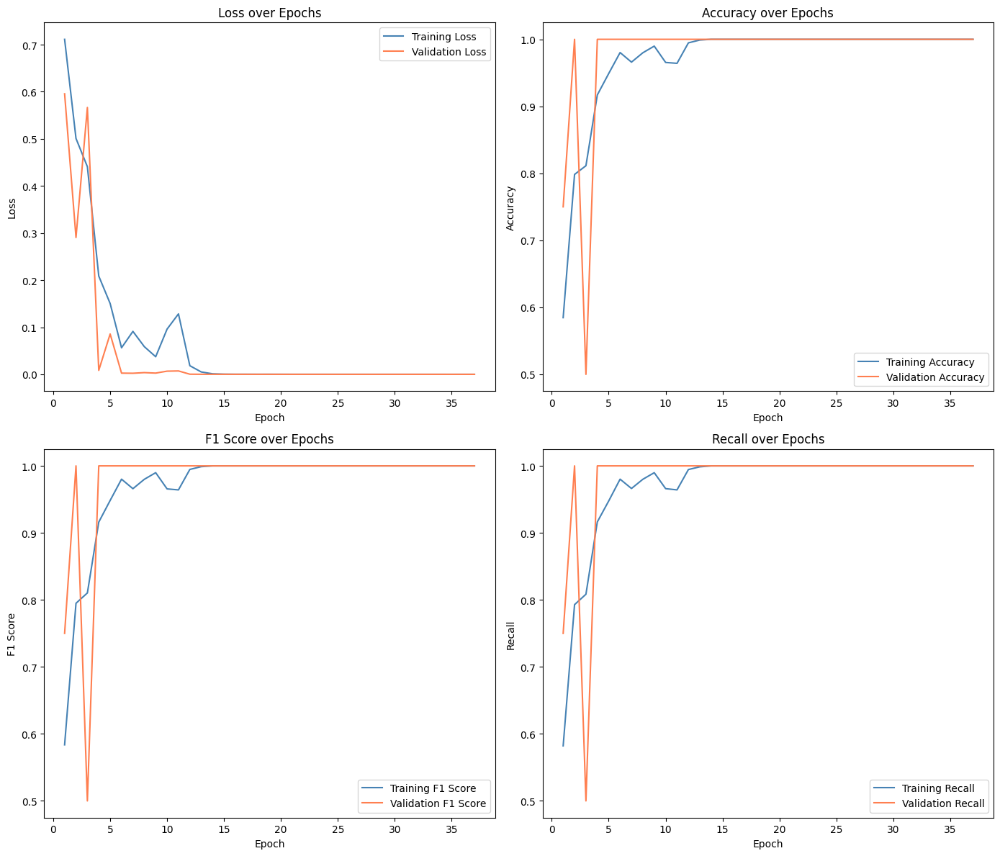

In [62]:
plot_training_history(training_history)

In [63]:
output_dir = "./models_not_final"
os.makedirs(output_dir, exist_ok = True)

In [64]:
# Save the final or best model with early stopping
early_stop_path = os.path.join(output_dir, "trained_parcel_classifier_early_stop.pth")

torch.save(model.state_dict(), early_stop_path)
print(f"💾 Trained model saved to {early_stop_path}")

💾 Trained model saved to ./models_not_final/trained_parcel_classifier_early_stop.pth


#### Evaluate model with test set

In [65]:
model.load_state_dict(torch.load("./models_not_final/trained_parcel_classifier_early_stop.pth"))
model.eval()

ParcelClassifier(
  (gat): GAT(
    (layers): ModuleList(
      (0): GATLayer(
        (conv): GATConv(1, 64, heads=2)
        (dropout): Dropout(p=0.5, inplace=False)
        (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (fc): Linear(in_features=128, out_features=128, bias=True)
  )
  (lstm): LSTMModel(
    (lstm): LSTM(360, 128, num_layers=2, batch_first=True, dropout=0.3)
    (dropout): Dropout(p=0.3, inplace=False)
  )
  (mlp): MLP(
    (fc1): Linear(in_features=256, out_features=128, bias=True)
    (dropout): Dropout(p=0.5, inplace=False)
    (fc2): Linear(in_features=128, out_features=2, bias=True)
  )
)

In [66]:
test_loss   = 0
all_outputs = []
all_targets = []

with torch.no_grad():
    test_batch_progress = tqdm(enumerate(test_loader_full),
                               total = len(test_loader_full),
                               desc  = "Evaluating on Test Set",
                               leave = False)
    for i, batch in test_batch_progress:
        fmri_test        = batch["fmri"].to(device)
        adj_test         = batch["adj"].to(device).squeeze(0)
        target_full_test = batch["target"].to(device)
        target_test      = target_full_test[:, -1, :, :].squeeze(1)
        output_test      = model(fmri_test, adj_test)
        loss             = criterion(output_test, target_test)
        test_loss       += loss.item() * fmri_test.size(0)

        # Collect outputs and targets for potential further analysis
        all_outputs.extend(output_test.cpu().numpy())
        all_targets.extend(target_test.cpu().numpy())
        test_batch_progress.set_postfix(loss = f"{loss.item():.4f}")

avg_test_loss = test_loss / len(test_loader_full)
print(f"\n🧪 Average Test Loss: {avg_test_loss:.4f}")


if all(0 <= t <= 1 for t in np.unique(np.array(all_targets))): # Check if targets are binary
    predicted_classes = (np.array(all_outputs) > 0.5).astype(int)
    accuracy = np.mean(predicted_classes == np.array(all_targets))
    print(f"📊 Test Accuracy: {accuracy:.4f}")

Evaluating on Test Set:   0%|          | 0/40 [00:00<?, ?it/s]


🧪 Average Test Loss: 0.0001
📊 Test Accuracy: 1.0000


In [67]:
# Save pretrained model in main directory if it performs well
final_model_output_dir = "../models"
model_final_path       = os.path.join(final_model_output_dir, "WMAD_model_alt_version.pth")

torch.save(model.state_dict(), model_final_path)
print(f"💾 Trained model saved as {model_final_path}")

💾 Trained model saved as ../models/WMAD_model_alt_version.pth


## Prediction of non-WM inputs

#### Helper functions for prediction of non-WM inputs

In [68]:
def load_fmri_data(subject_id, task):
    """
    Loads the concatenated fMRI timeseries data for a given subject and task
    ('emotion' or 'language') for both LR and RL runs.

    Args:
        subject_id (str): The ID of the subject.
        task       (str): The name of the task ('EMOTION' or 'LANGUAGE').

    Returns:
        np.ndarray or None: Array of concatenated BOLD data values with shape
                            (n_timepoints x n_parcels), or None if loading fails.
    """
    all_runs_data = []
    for run_index in range(2):  # Iterate over LR and RL runs
        try:
            ts = load_single_timeseries(subject_id, task, run_index, remove_mean=True)
            all_runs_data.append(ts.T)  # Transpose to (n_timepoints x n_parcels)
        except FileNotFoundError as e:
            print(f"Error loading timeseries for subject {subject_id}, task {task}, run {RUNS[run_index]}: {e}")
            return None
        except Exception as e:
            print(f"An error occurred while loading data for subject {subject_id}, task {task}, run {RUNS[run_index]}: {e}")
            return None

    if all_runs_data:
        # Concatenate the timeseries from both runs along the time dimension
        concatenated_data = np.concatenate(all_runs_data, axis = 0)
        return concatenated_data
    else:
        return None

In [69]:
def load_single_timeseries(subject, experiment, run, remove_mean = True):
    """Loads timeseries data for a single subject and single run."""
    bold_run  = RUNS[run]
    bold_path = f"{HCP_DIR}/subjects/{subject}/{experiment}/tfMRI_{experiment}_{bold_run}"
    ts_path   = f"{bold_path}/data.npy"

    if not os.path.exists(ts_path):
        raise FileNotFoundError(f"Timeseries file not found: {ts_path}")
    ts = np.load(ts_path)

    if remove_mean:
        ts = ts - ts.mean(axis=1, keepdims = True)  # Normalize by removing mean signal
    return ts

In [70]:
def calculate_adjacency_matrix(fmri_data):
    """
    Calculates the adjacency matrix from fMRI data using Pearson correlation.

    Args:
        fmri_data (np.ndarray): Array of BOLD data values with shape (n_timepoints x n_parcels).

    Returns:
        np.ndarray: Adjacency matrix of shape (n_parcels x n_parcels), or None if calculation fails.
    """
    try:
        correlation_matrix = np.corrcoef(fmri_data, rowvar=False)
        # Ensure the matrix is symmetric and has no NaN values
        correlation_matrix = (correlation_matrix + correlation_matrix.T) / 2
        correlation_matrix = np.nan_to_num(correlation_matrix)
        return correlation_matrix
    except Exception as e:
        print(f"Error calculating adjacency matrix: {e}")
        return None

In [71]:
def generate_condition_data(subject_id, task, output_dir):
    """
    Generates and saves condition-specific fMRI data and adjacency matrices.

    Args:
        subject_id (str): The ID of the subject.
        task (str): The name of the task ('EMOTION' or 'LANGUAGE').
        output_dir (str): The directory to save the data.
    """
    if task not in EXPERIMENTS:
        print(f"Task '{task}' not found in EXPERIMENTS.")
        return

    subject_output_dir = os.path.join(output_dir, subject_id)
    os.makedirs(subject_output_dir, exist_ok = True)

    for run_index in range(2):
        try:
            ts  = load_single_timeseries(subject_id, task, run_index, remove_mean = True)
            evs = load_evs_as_dict(subject_id, task, run_index)

            for condition in EXPERIMENTS[task]["cond"]:
                if condition in evs:
                    onset_times = evs[condition]["onset"]
                    durations   = evs[condition]["duration"]

                    condition_time_points = []
                    for onset, duration in zip(onset_times, durations):
                        start_frame = int(onset / TR)
                        end_frame   = start_frame + int(duration / TR)
                        condition_time_points.extend(range(start_frame, end_frame))

                    if condition_time_points:
                        n_timepoints = ts.shape[1]          # Get the number of time points in the current run
                        valid_condition_time_points = [tp for tp in condition_time_points if tp < n_timepoints]

                        if valid_condition_time_points:
                            condition_bold_data = ts[:, valid_condition_time_points].T  # (n_timepoints_condition, n_parcels)
                            adj_matrix          = calculate_adjacency_matrix(condition_bold_data)

                            fmri_filename = os.path.join(subject_output_dir, f"{task}_{condition}_run{RUNS[run_index]}_fmri.npy")
                            adj_filename  = os.path.join(subject_output_dir, f"{task}_{condition}_run{RUNS[run_index]}_adj.npy")

                            np.save(fmri_filename, condition_bold_data)
                            if adj_matrix is not None:
                                np.save(adj_filename, adj_matrix)
                            else:
                                print(f"Warning: Could not calculate adjacency for {subject_id}, {task}, {condition}, run {RUNS[run_index]}.")
                        else:
                            print(f"Warning: No *valid* time points found for {subject_id}, {task}, {condition}, run {RUNS[run_index]} (original calculation out of bounds).")
                    else:
                        print(f"Warning: No time points found for {subject_id}, {task}, {condition}, run {RUNS[run_index]}.")

        except FileNotFoundError as e:
            print(f"Error loading data for {subject_id}, {task}, run {RUNS[run_index]}: {e}")
        except Exception as e:
            print(f"An error occurred for {subject_id}, {task}, run {RUNS[run_index]}: {e}")

In [72]:
def load_condition_specific_data(subject_id, task, condition, data_dir, max_time_points=304):
    """
    Loads condition-specific fMRI and adjacency data.

    Args:
        subject_id (str): The ID of the subject.
        task (str): The name of the task ('EMOTION' or 'LANGUAGE').
        condition (str): The specific condition ('fear', 'neut', 'story', 'math').
        data_dir (str): The directory where the condition data is saved.
        max_time_points (int): The maximum number of time points to keep.

    Returns:
        dict or None: A dictionary containing 'fmri' and 'adj' tensors, or None if loading fails.
    """
    all_runs_fmri = []
    all_runs_adj  = []
    for run_index in range(2):
        run_str       = RUNS[run_index]
        fmri_filename = os.path.join(data_dir, subject_id, f"{task}_{condition}_run{run_str}_fmri.npy")
        adj_filename  = os.path.join(data_dir, subject_id, f"{task}_{condition}_run{run_str}_adj.npy")

        try:
            fmri_data = np.load(fmri_filename)
            
            if fmri_data.shape[0] > max_time_points:
                fmri_data = fmri_data[:max_time_points, :]
            all_runs_fmri.append(fmri_data)
            
            if os.path.exists(adj_filename):
                all_runs_adj.append(np.load(adj_filename))
            
            else:
                print(f"Warning: Adjacency matrix not found for {subject_id}, {task}, {condition}, run {run_str}. Calculating on the fly.")
                all_runs_adj.append(calculate_adjacency_matrix(fmri_data))
        
        except FileNotFoundError:
            print(f"Error: fMRI data not found for {subject_id}, {task}, {condition}, run {run_str}.")
            return None
        
        except Exception as e:
            print(f"An error occurred loading data for {subject_id}, {task}, {condition}, run {run_str}: {e}")
            return None

    if all_runs_fmri:
        concatenated_fmri = np.concatenate(all_runs_fmri, axis=0)
        
        if concatenated_fmri.shape[0] > max_time_points * 2: # Adjust for concatenation
            concatenated_fmri = concatenated_fmri[:max_time_points * 2, :] # Adjust truncation

        # Average the adjacency matrices across runs
        if all_runs_adj and all(adj is not None for adj in all_runs_adj):
            avg_adj = np.mean(np.stack(all_runs_adj), axis = 0)
        elif all_runs_fmri:
            avg_adj = calculate_adjacency_matrix(concatenated_fmri)
        else:
            return None

        return {
            "fmri": torch.tensor(concatenated_fmri, dtype = torch.float32).unsqueeze(0),
            "adj" : torch.tensor(avg_adj, dtype = torch.float32).unsqueeze(0)
        }
    else:
        return None

#### Prepare for prediction

In [74]:
subjects_to_predict = SubjectIDs
tasks_to_predict    = ["EMOTION", "LANGUAGE"]

# Load the trained model
model.load_state_dict(torch.load("../models/WMAD_model_alt_version.pth"))
model.eval()

ParcelClassifier(
  (gat): GAT(
    (layers): ModuleList(
      (0): GATLayer(
        (conv): GATConv(1, 64, heads=2)
        (dropout): Dropout(p=0.5, inplace=False)
        (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (fc): Linear(in_features=128, out_features=128, bias=True)
  )
  (lstm): LSTMModel(
    (lstm): LSTM(360, 128, num_layers=2, batch_first=True, dropout=0.3)
    (dropout): Dropout(p=0.3, inplace=False)
  )
  (mlp): MLP(
    (fc1): Linear(in_features=256, out_features=128, bias=True)
    (dropout): Dropout(p=0.5, inplace=False)
    (fc2): Linear(in_features=128, out_features=2, bias=True)
  )
)

In [75]:
# Define the output directory and create it
output_data_dir = "./nonWM_data_for_prediction"
os.makedirs(output_data_dir, exist_ok = True)

# Loop through subjects and tasks to generate the data
for subject_id in SubjectIDs:
    for task in ["EMOTION", "LANGUAGE"]:
        generate_condition_data(subject_id, task, output_data_dir)

print("Condition-specific fMRI data and adjacency matrices generated and saved to:", output_data_dir)

🔍 Checking: RUNS[0] = LR for experiment EMOTION
🔍 Checking: RUNS[1] = RL for experiment EMOTION
🔍 Checking: RUNS[0] = LR for experiment LANGUAGE
🔍 Checking: RUNS[1] = RL for experiment LANGUAGE
🔍 Checking: RUNS[0] = LR for experiment EMOTION
🔍 Checking: RUNS[1] = RL for experiment EMOTION
🔍 Checking: RUNS[0] = LR for experiment LANGUAGE
🔍 Checking: RUNS[1] = RL for experiment LANGUAGE
🔍 Checking: RUNS[0] = LR for experiment EMOTION
🔍 Checking: RUNS[1] = RL for experiment EMOTION
🔍 Checking: RUNS[0] = LR for experiment LANGUAGE
🔍 Checking: RUNS[1] = RL for experiment LANGUAGE
🔍 Checking: RUNS[0] = LR for experiment EMOTION
🔍 Checking: RUNS[1] = RL for experiment EMOTION
🔍 Checking: RUNS[0] = LR for experiment LANGUAGE
🔍 Checking: RUNS[1] = RL for experiment LANGUAGE
🔍 Checking: RUNS[0] = LR for experiment EMOTION
🔍 Checking: RUNS[1] = RL for experiment EMOTION
🔍 Checking: RUNS[0] = LR for experiment LANGUAGE
🔍 Checking: RUNS[1] = RL for experiment LANGUAGE
🔍 Checking: RUNS[0] = LR for e

In [76]:
subjects_to_predict       = SubjectIDs
conditions_to_predict     = {"EMOTION": ["fear", "neut"], "LANGUAGE": ["story", "math"]}
all_condition_predictions = {}
condition_data_dir        = "./nonWM_data_for_prediction"

# Load the trained model
model.load_state_dict(torch.load("./models_not_final/trained_parcel_classifier_early_stop.pth"))
model.eval()

with torch.no_grad():
    for subject_id in tqdm(subjects_to_predict, desc = "Predicting Subjects"):
        all_condition_predictions[subject_id] = {}
        
        for task, conditions in conditions_to_predict.items():
            all_condition_predictions[subject_id][task] = {}
            
            for condition in conditions:
                prepared_data = load_condition_specific_data(subject_id, task, condition, condition_data_dir)
                
                if prepared_data:
                    fmri_tensor = prepared_data["fmri"].to(device)
                    adj_tensor  = prepared_data["adj"].to(device).squeeze(0).to(device)

                    output = model(fmri_tensor, adj_tensor)
                    predicted_labels = (output > 0.5).int().cpu().numpy()
                    all_condition_predictions[subject_id][task][condition] = predicted_labels
                else:
                    all_condition_predictions[subject_id][task][condition] = None

print("\nCondition-based predictions completed!")

Predicting Subjects:   0%|          | 0/100 [00:00<?, ?it/s]


Condition-based predictions completed!


#### Visulization with various plots

In [82]:
figures_output_dir = "../figures/"
os.makedirs(figures_output_dir, exist_ok = True)

Generating 3D plot of prediction frequency for EMOTION - fear...
Generating 3D plot of prediction frequency for EMOTION - neut...
Generating 3D plot of prediction frequency for LANGUAGE - story...
Generating 3D plot of prediction frequency for LANGUAGE - math...


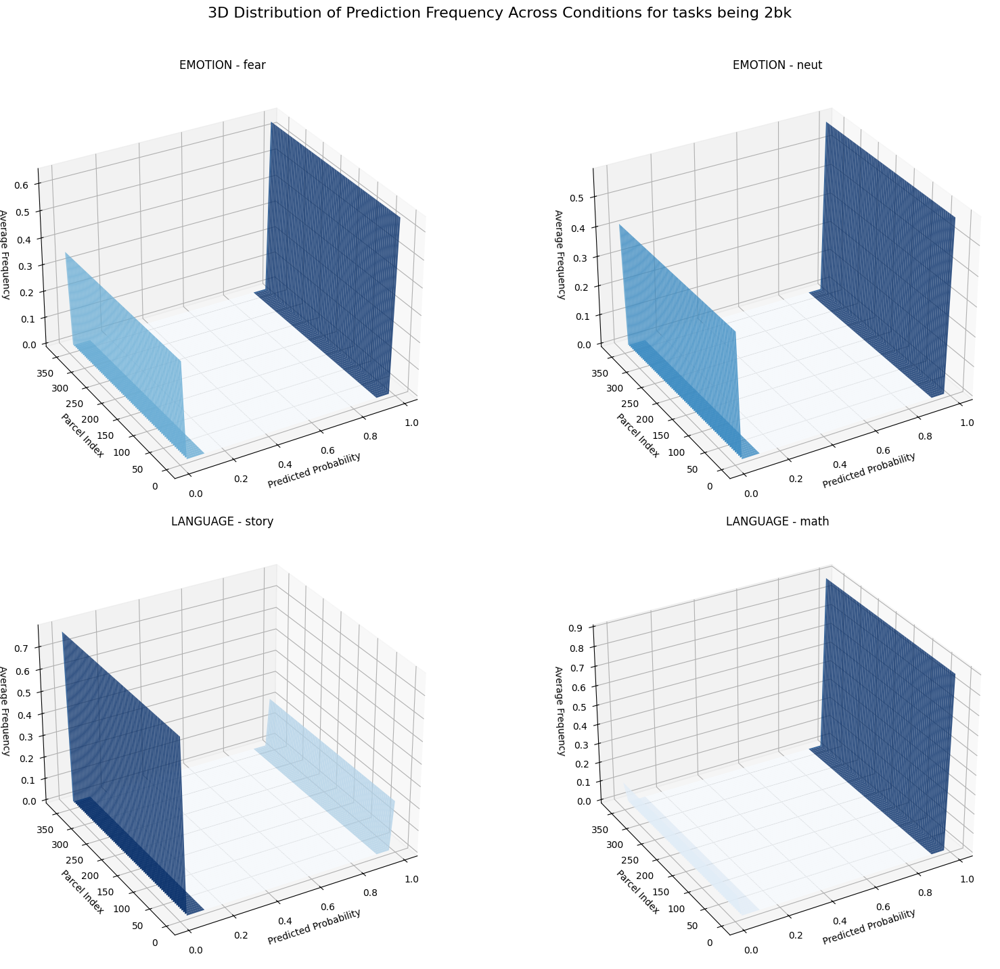

3D histogram saved to: ../figures/WMAD_histogram_3d.png


<Figure size 640x480 with 0 Axes>

In [83]:
cmap = sns.color_palette("Blues", as_cmap = True)

conditions_to_plot = {"EMOTION": ["fear", "neut"], "LANGUAGE": ["story", "math"]}
n_parcels          = 360
n_bins             = 50  # Number of probability bins
probability_bins   = np.linspace(0, 1, n_bins + 1)
prob_bin_centers   = (probability_bins[:-1] + probability_bins[1:]) / 2
parcel_indices     = np.arange(1, n_parcels + 1)

X, Y = np.meshgrid(prob_bin_centers, parcel_indices)

fig  = plt.figure(figsize=(18, 14))
axes = {}

plot_index = 1

for task, conditions in conditions_to_plot.items():
    for condition in conditions:
        print(f"Generating 3D plot of prediction frequency for {task} - {condition}...")
        all_subject_parcel_frequencies = []

        for subject_id in all_condition_predictions:
            
            if task in all_condition_predictions[subject_id] and \
               condition in all_condition_predictions[subject_id][task] and \
               all_condition_predictions[subject_id][task][condition] is not None:
                predictions                = all_condition_predictions[subject_id][task][condition]
                predictions_squeezed       = predictions.squeeze(0)
                subject_parcel_frequencies = np.zeros((n_parcels, n_bins))
                
                for parcel_idx in range(n_parcels):
                    parcel_preds = predictions_squeezed[parcel_idx, 1] # Get probability for class 1 (2bk)
                    hist, _      = np.histogram(parcel_preds, bins = probability_bins)
                    
                    subject_parcel_frequencies[parcel_idx, :] = hist
                all_subject_parcel_frequencies.append(subject_parcel_frequencies)

        if all_subject_parcel_frequencies:
            average_parcel_frequencies = np.mean(np.stack(all_subject_parcel_frequencies), axis = 0)

            # Create the 3D subplot
            ax = fig.add_subplot(2, 2, plot_index, projection = "3d")
            axes[(task, condition)] = ax

            # Plot the surface
            ax.plot_surface(X, Y, average_parcel_frequencies, cmap = cmap, rstride = 5, cstride = 5, alpha = 0.8)

            ax.set_xlabel("Predicted Probability", fontsize = 10)
            ax.set_ylabel("Parcel Index"         , fontsize = 10)
            ax.set_zlabel("Average Frequency"    , fontsize = 10)
            ax.set_title(f"{task} - {condition}" , fontsize = 12)
            ax.view_init(elev = 30, azim = -120)
            plot_index += 1
        else:
            print(f"No prediction data available for {task} - {condition}.")

plt.suptitle("3D Distribution of Prediction Frequency Across Conditions for tasks being 2bk", fontsize = 16, y = 1.02)
plt.tight_layout()
plt.show()

hist_filepath = os.path.join(figures_output_dir, "WMAD_histogram_3d.png")
plt.savefig(hist_filepath)
print(f"3D histogram saved to: {hist_filepath}")

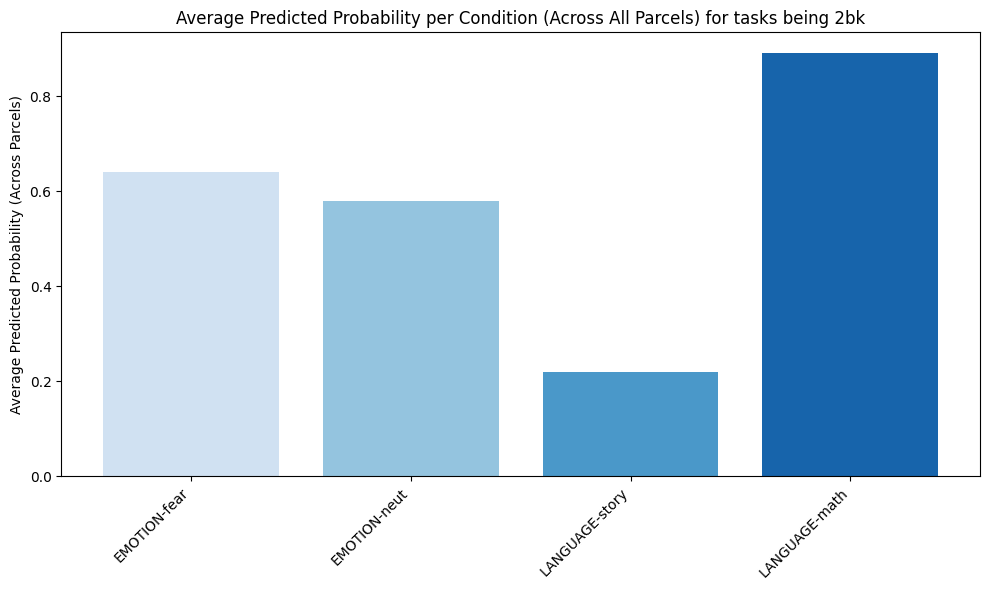

Average codition probabilities saved to: ../figures/WMAD_average_pred_per_condition.png


<Figure size 640x480 with 0 Axes>

In [84]:
conditions_to_plot        = {"EMOTION": ["fear", "neut"], "LANGUAGE": ["story", "math"]}
avg_condition_predictions = {}

for task, conditions in conditions_to_plot.items():
    
    for condition in conditions:
        all_subject_avg_preds = []
        
        for subject_id in all_condition_predictions:
            
            if task in all_condition_predictions[subject_id] and \
               condition in all_condition_predictions[subject_id][task] and \
               all_condition_predictions[subject_id][task][condition] is not None:
                predictions          = all_condition_predictions[subject_id][task][condition]
                predictions_squeezed = predictions.squeeze(0)
                
                if predictions_squeezed.ndim > 1 and predictions_squeezed.shape[0] == n_parcels:
                    all_subject_avg_preds.append(np.mean(predictions_squeezed[:, 1]))
                
                elif predictions_squeezed.ndim == 1 and predictions_squeezed.shape[0] == n_parcels:
                    all_subject_avg_preds.append(np.mean(predictions_squeezed))
                
                elif predictions_squeezed.ndim == 2 and predictions_squeezed.shape[1] == n_parcels: # Handle (time, n_parcels)
                    all_subject_avg_preds.append(np.mean(predictions_squeezed[:, :]))
                
                elif predictions_squeezed.ndim == 3 and predictions_squeezed.shape[1] == n_parcels: # Handle (1, n_parcels, 2)
                    all_subject_avg_preds.append(np.mean(predictions_squeezed[0, :, 1]))

        if all_subject_avg_preds:
            avg_condition_predictions[(task, condition)] = np.mean(all_subject_avg_preds)
        else:
            avg_condition_predictions[(task, condition)] = np.nan

conditions = list(avg_condition_predictions.keys())
averages   = list(avg_condition_predictions.values())
colors     = sns.color_palette("Blues", len(conditions))

plt.figure(figsize=(10, 6))
plt.bar(range(len(conditions)), averages, color=colors)
plt.xticks(range(len(conditions)), [f'{t}-{c}' for t, c in conditions], rotation = 45, ha = "right")
plt.ylabel("Average Predicted Probability (Across Parcels)")
plt.title("Average Predicted Probability per Condition (Across All Parcels) for tasks being 2bk")
plt.tight_layout()
plt.show()

avg_pred_filepath = os.path.join(figures_output_dir, "WMAD_average_pred_per_condition.png")
plt.savefig(avg_pred_filepath)
print(f"Average codition probabilities saved to: {avg_pred_filepath}")

#### Visualization on a brain surface

Download the `glasser360MNI.nii.gz` file from [this link](https://github.com/brainspaces/glasser360/blob/master/glasser360MNI.nii.gz) and store it in the main directory.

In [85]:
parcellation_file = "../glasser360MNI.nii.gz"
output_dir        = "glass_brain_predictions"

os.makedirs(output_dir, exist_ok = True)

conditions_to_plot = {"EMOTION": ["fear", "neut"], "LANGUAGE": ["story", "math"]}
n_parcels          = 360
thresholds         = [0.4, 0.6]

try:
    parcellation_img  = nib.load(parcellation_file)
    parcellation_data = parcellation_img.get_fdata().astype(int)
    affine            = parcellation_img.affine

except FileNotFoundError:
    print(f"Error: Parcellation file not found at {parcellation_file}")
    exit()

def get_average_prediction_per_parcel(task, condition):
    parcel_avg_preds = np.zeros(n_parcels)
    subject_count    = 0
    
    for subject_id in all_condition_predictions:
        
        if task in all_condition_predictions[subject_id] and \
           condition in all_condition_predictions[subject_id][task] and \
           all_condition_predictions[subject_id][task][condition] is not None:
            predictions = all_condition_predictions[subject_id][task][condition].squeeze(0)
            
            if predictions.ndim > 1 and predictions.shape[0] == n_parcels:
                parcel_avg_preds += predictions[:, 1]
                subject_count += 1
            
            elif predictions.ndim == 1 and predictions.shape[0] == n_parcels:
                parcel_avg_preds += predictions
                subject_count += 1
            
            elif predictions.ndim == 2 and predictions.shape[1] == n_parcels: # Handle (time, n_parcels)
                parcel_avg_preds += np.mean(predictions[:, :], axis=0)
                subject_count += 1
            
            elif predictions.ndim == 3 and predictions.shape[1] == n_parcels: # Handle (1, n_parcels, 2)
                parcel_avg_preds += predictions[0, :, 1]
                subject_count += 1
    
    if subject_count > 0:
        return parcel_avg_preds / subject_count
    
    else:
        return None



for task, conditions in conditions_to_plot.items():
    for condition in conditions:
        avg_preds = get_average_prediction_per_parcel(task, condition)
        
        if avg_preds is not None:
            # Create a volume of average predictions
            prediction_volume = np.zeros_like(parcellation_data, dtype = np.float32)
            for parcel_index in range(1, n_parcels + 1):
                mask = (parcellation_data == parcel_index)
                
                if np.any(mask):
                    prediction_volume[mask] = avg_preds[parcel_index - 1]

            prediction_img = nib.Nifti1Image(prediction_volume, affine)

            for threshold_value in thresholds:
                threshold_str = str(threshold_value).replace(".", "_")
                plot_title    = f"{task}-{condition}_threshold_{threshold_str}"
                output_file   = os.path.join(output_dir, f"glass_brain_{plot_title}.png")

                try:
                    plotting.plot_glass_brain(
                        stat_map_img = prediction_img,
                        threshold    = threshold_value,
                        title        = plot_title,
                        output_file  = output_file,
                        display_mode = "ortho",
                        cut_coords=( -50, -25, 0, 25, 50,
                                     -70, -35, 0, 35, 70,
                                     -40, -20, 0, 20, 40) # Explicit cut coordinates
                    )
                    
                    print(f"Generated glass brain plot: {output_file}")
                
                except Exception as e:
                    print(f"Error generating glass brain for {plot_title}: {e}")
        
        else:
            print(f"No average prediction data for {task} - {condition}")

if avg_preds is not None:
    print("Glass brain plots generated.")

Generated glass brain plot: glass_brain_predictions/glass_brain_EMOTION-fear_threshold_0_4.png
Generated glass brain plot: glass_brain_predictions/glass_brain_EMOTION-fear_threshold_0_6.png
Generated glass brain plot: glass_brain_predictions/glass_brain_EMOTION-neut_threshold_0_4.png


/home/saameh/.local/lib/python3.10/site-packages/nilearn/plotting/displays/_slicers.py:313: UserWarning: empty mask
  ims = self._map_show(img, type="imshow", threshold=threshold, **kwargs)


Generated glass brain plot: glass_brain_predictions/glass_brain_EMOTION-neut_threshold_0_6.png
Generated glass brain plot: glass_brain_predictions/glass_brain_LANGUAGE-story_threshold_0_4.png
Generated glass brain plot: glass_brain_predictions/glass_brain_LANGUAGE-story_threshold_0_6.png
Generated glass brain plot: glass_brain_predictions/glass_brain_LANGUAGE-math_threshold_0_4.png
Generated glass brain plot: glass_brain_predictions/glass_brain_LANGUAGE-math_threshold_0_6.png
Glass brain plots generated.
